## Latitude bands recycling
- running with merged data (zero evap over ocean) over three different band options
- running with rotation options and plotting seasonal averages for all rotations

In [1]:
import numpy as np
import xarray as xr
import pandas as pd
import scipy
import sys 
import warnings
warnings.filterwarnings('ignore')
import geopandas as gpd
from shapely.geometry import mapping
import cartopy.crs as ccrs
import cartopy.feature
import matplotlib.pyplot as plt
import time as timer
start_all = timer.time()

In [2]:
mask = xr.open_dataset("/Users/ellendyer/Documents/GitHub/f4r-bulk-recycling-model/lsm_1279l4_0.1x0.1.grb_v4_unpack.nc")['lsm']
mask = mask.rename({'latitude':'lat','longitude':'lon'})
mask = mask.squeeze(['time'], drop=True)
mask = mask.where(mask.lon<24.0,1)
water = mask.where(mask==0.0,drop=True)

### Read in surface and pressure level files
**Surface file options:**
- S_SE (surface vars including only surface evaporation)
- S_LSE (surface vars including land and surface evaporation)

**Pressure level file options:**
- L_M (pressure level vars resampled to monthly timestep)
- L_HI (pressure level vars with integrated moist flux calcualted hourly and then resampled to monthly timestep)

In [3]:
YR = 1990
dataf ="/Volumes/ESA_F4R/era_test/" 
datao ="/Volumes/ESA_F4R/ed_prepare/2026_rho/bands_rho/" 
datap ="/Volumes/ESA_F4R/ed_prepare/2026_plots/bands_rho_tests/" 
datas ="/Users/ellendyer/Library/Mobile Documents/com~apple~CloudDocs/1SHARED_WORK/Work/3_ESA_GRANT/MODEL/Shapefiles/"
shp_cod = gpd.read_file(datas+"congo_basin_evergreen.shp")

S_NAME = "S_SE" # S_SE or S_LSE 
L_NAME = "L_M" # L_M or L_HI

### Band definitions used
- North: 5-12**N** / 10-31**E**
- Equatorial: 5**S**-5**N** / 8-29**E**
- South: 15-5**S** / 12-31**E**

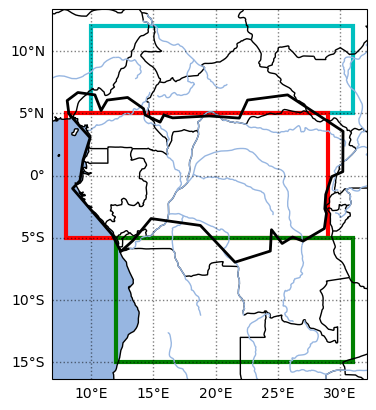

<Figure size 640x480 with 0 Axes>

In [4]:
band = {'N':[5,12,10,31],'EQ':[-5,5,8,29],'S':[-15,-5,12,31]}
B='EQ'

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
ax.add_feature(cartopy.feature.RIVERS)
ax.add_feature(cartopy.feature.OCEAN)
ax.add_patch(plt.Rectangle((10, 5), 21, 7, ls="-", lw=3, ec="c", fc="none"))
ax.add_patch(plt.Rectangle((8, -5), 21, 10, ls="-", lw=3, ec="r", fc="none"))
ax.add_patch(plt.Rectangle((12, -15), 19, 10, ls="-", lw=3, ec="g", fc="none"))
shp_cod.plot(ax=ax, edgecolor='black',facecolor='none',lw=2,zorder=2,linestyle='-')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
plt.show()
plt.clf()

#### **Read in pre-processed files that have the following conversions:**

**Read in ERA5 data on pressure levels**
- resampled to monthly MS timestep
- shum multiplied by 1000 to convert from kg/kg --> g/kg
- pressure levels are divided by 100 to convert from Pa to hPa (only for fortnightly files)
- sort data by descending pressure levels (only for fortnightly files)


**Input file units:**
- plev - pa
- q - kg/kg
- u - m/s
- v - m/s

** ***Might include Fx and Fy if L_HI is being read in***

**Read in ERA5 land and surface data**
- Land: selecting hour 23 (0-23) of Prec and Evap because of how ERA5 Land variables are accumulated (https://confluence.ecmwf.int/pages/viewpage.action?pageId=197702790 - https://confluence.ecmwf.int/display/CKB/ERA5-Land%3A+data+documentation#ERA5Land:datadocumentation-accumulationsAccumulations)
- Surface: evap is accumulated per hour so a daily sum is calculated
- prec is multiplied by 1000 to convert from m to mm
- evap is multiplied by -1000 to convert from m to mm and upward fluxes in land model are considered negative
- Prec, Evap, and Psfc are then resampled to MS monthly and also interpolated to coarser pressure level grid

**Input file units:**
- tp - m (no longer reading in)
- e - m (-)
- sp - pa

**Merging all input datasets into one dataset for recyling code called ds**
- close both input datasets
- sort everything so latitude is south to north
- transpose dimensions so they run (lon,lat,level,time) as in recycling code
- save input ds to file

**Integrate zonal and meridional moisture flux**
- **Must check if there are any nans in input arrays** - there can be none because we are using nans as an indicator in the modified definitions

<xarray.Dataset> Size: 181MB
Dimensions:    (time: 12, lat: 141, lon: 141, level: 37)
Coordinates:
    number     int64 8B 0
  * time       (time) datetime64[ns] 96B 1990-01-01 1990-02-01 ... 1990-12-01
  * lat        (lat) float64 1kB 15.0 14.75 14.5 14.25 ... -19.5 -19.75 -20.0
  * lon        (lon) float64 1kB 0.0 0.25 0.5 0.75 1.0 ... 34.25 34.5 34.75 35.0
    expver     (time) <U4 192B '0001' '0001' '0001' ... '0001' '0001' '0001'
  * level      (level) float64 296B 1e+03 975.0 950.0 925.0 ... 5.0 3.0 2.0 1.0
Data variables:
    tp         (time, lat, lon) float32 954kB ...
    e          (time, lat, lon) float32 954kB 0.09641 0.08115 ... 4.622 4.552
    r          (time, level, lat, lon) float32 35MB ...
    Shum       (time, level, lat, lon) float32 35MB 3.242 3.253 ... 0.00384
    t          (time, level, lat, lon) float32 35MB ...
    Uwnd       (time, level, lat, lon) float32 35MB ...
    Vwnd       (time, level, lat, lon) float32 35MB ...
    Psfc       (time, lat, lon) float

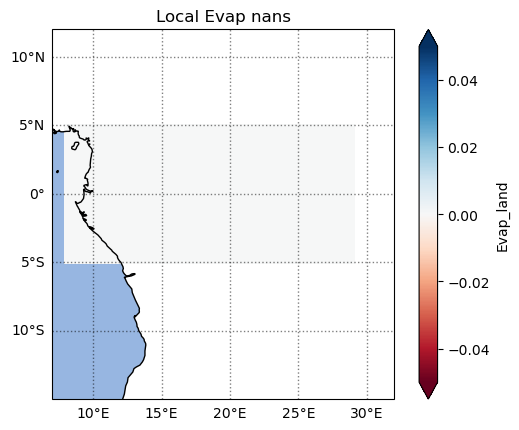

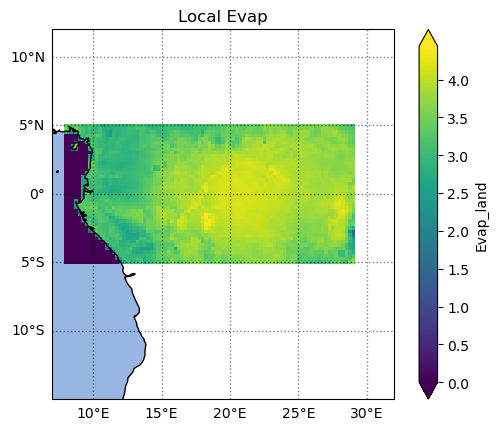

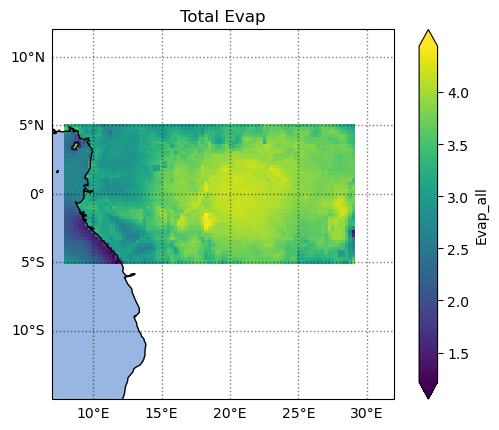

False
41820


<Figure size 640x480 with 0 Axes>

In [5]:
dsS = xr.open_dataset(dataf+"era5_surface_e_tp_1990.nc")
dsP = xr.open_dataset(dataf+"era5_surface_sp_1990.nc")
dsL = xr.open_dataset(dataf+"era5_levels_1990.nc")
dsS['valid_time'] = dsP['valid_time']
ds = xr.merge([dsS,dsL,dsP])


ds['e']=-1000.0*ds['e']
ds['q']=1000.0*ds['q']
ds['sp']=ds['sp']/100.0

ds['Evap_all'] = ds['e']
ds = ds.rename({'pressure_level':'level','valid_time':'time','latitude':'lat','longitude':'lon','sp':'Psfc','u':'Uwnd','v':'Vwnd','q':'Shum'})
mask_surf = mask.interp(lat=ds['lat'],lon=ds['lon'],method='linear',kwargs={"fill_value": "extrapolate"})
ds['Evap_land'] = ds['e'].where(mask_surf!=0.0,0,0)
print(ds)
ds = ds.sortby('lat', ascending=True)
print(ds)


#Running the code with an irregular boundary means that there will be nans once the data is clipped
#For this to work properly it is important that there are no nans in the input data which would 
#actually be missing data where recycling will be calculated
print(np.isnan(ds['Evap_land'].values).any())
print(ds['Evap_land'].isnull().count().values)
print('Number of nans in Evap_land: ', ds['Evap_land'].where(np.isnan(ds['Evap_land'])==True,drop=True).count().values)
print('Number of nans in Evap_all: ', ds['Evap_all'].where(np.isnan(ds['Evap_all'])==True,drop=True).count().values)
#print('Number of nans in Prec: ', ds['Prec'].where(np.isnan(ds['Prec'])==True,drop=True).count().values)
print('Number of nans in Psfc: ', ds['Psfc'].where(np.isnan(ds['Psfc'])==True,drop=True).count().values)
print('Number of nans in Uwnd: ', ds['Uwnd'].where(np.isnan(ds['Uwnd'])==True,drop=True).count().values)
print('Number of nans in Vwnd: ', ds['Vwnd'].where(np.isnan(ds['Vwnd'])==True,drop=True).count().values)
print('Number of nans in Shum: ', ds['Shum'].where(np.isnan(ds['Shum'])==True,drop=True).count().values)

#Clip out specific band
ds = ds.transpose("time","level","lat","lon",missing_dims='ignore')
ds = ds.sel(lon=slice(band[B][2],band[B][3]),lat=slice(band[B][0],band[B][1]))
#ds['Evap_land'] = ds['Evap_land'].fillna(0.0)

Evap_land_nan = ds['Evap_land'].where(ds['Evap_land'].isnull(),0.0)
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.OCEAN)
Evap_land_nan.mean('time').plot(ax=ax,transform=ccrs.PlateCarree(),
                                       add_colorbar=True,
                                       #vmin=0,vmax=2,
                                       alpha=1,
                                       cmap=plt.cm.RdBu,
                                       extend="both")

ax.set_extent([7, 32, -15, 12])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
ax.set_title('Local Evap nans')
#plt.savefig('Local Evap nans')
plt.show()
plt.clf()


ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.OCEAN)
ds['Evap_land'].mean('time').plot(ax=ax,transform=ccrs.PlateCarree(),
                                       add_colorbar=True,
                                       #vmin=0,vmax=2,
                                       alpha=1,
                                       cmap=plt.cm.viridis,
                                       extend="both")

ax.set_extent([7, 32, -15, 12])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
ax.set_title('Local Evap')
#plt.savefig()
plt.show()
plt.clf()

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.OCEAN)
ds['Evap_all'].mean('time').plot(ax=ax,transform=ccrs.PlateCarree(),
                                       add_colorbar=True,
                                       #vmin=0,vmax=2,
                                       alpha=1,
                                       cmap=plt.cm.viridis,
                                       extend="both")

ax.set_extent([7, 32, -15, 12])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
ax.set_title('Total Evap')
#plt.savefig()
plt.show()
plt.clf()
          
ds = ds.transpose("lon","lat","level","time",missing_dims='ignore')
print(np.isnan(ds['Evap_land'].values).any())
print(ds['Evap_land'].isnull().count().values)


mask = xr.open_dataset("/Users/ellendyer/Documents/GitHub/f4r-bulk-recycling-model/lsm_1279l4_0.1x0.1.grb_v4_unpack.nc")['lsm']
mask = mask.rename({'latitude':'lat','longitude':'lon'})
mask = mask.squeeze(['time'], drop=True)
mask = mask.where(mask.lon<24.0,1)

In [6]:
if L_NAME=='L_HI':
    Fx = ds['Fx']
    Fy = ds['Fy']
else:
    #Prepping datasets near surface for recycling
    import bulk_recycling_model.numerical_integration
    
    # Integrate 10^-3 Shum Uwnd dp
    # Because the integration limits are from high pressure to low pressure, we need to invert the sign.
    integrand = -1 * 1e-3 * ds["Shum"] * ds["Uwnd"]
    Fx = bulk_recycling_model.numerical_integration.integrate_no_extrapolation(integrand, ds["Psfc"])
    # Units: mb x m/s
    
    # Integrate 10^-3 Shum Vwnd dp
    # Because the integration limits are from high pressure to low pressure, we need to invert the sign.
    integrand = -1 * 1e-3 * ds["Shum"] * ds["Vwnd"]
    Fy = bulk_recycling_model.numerical_integration.integrate_no_extrapolation(integrand, ds["Psfc"])
    # Units: mb x m/s

**Prepare scaled data for recycling code**
- Evaporation and moisture fluxes


In [7]:
# Prepare and scale the data
from bulk_recycling_model import preprocess
from bulk_recycling_model.axis import Axis
from bulk_recycling_model.scaling import Scaling, UnitSystem

# degrees
L = ds.coords["lon"].max().item() - ds.coords["lon"].min().item()
# convert to meters
L = L * 111e3 * np.cos(np.deg2rad(ds.coords["lat"].mean().item()))
dx = L / ds.sizes["lon"]

# lon axis
lon_axis = Axis(
    ds.coords["lon"].min().item(),
    ds.coords["lon"].diff("lon").mean().item(),
    ds.sizes["lon"],
)

# degrees
H = ds.coords["lat"].values[-1] - ds.coords["lat"].values[0]
# convert to meters
H = H * 111e3
dy = H / ds.sizes["lat"]

# lat axis
lat_axis = Axis(
    ds.coords["lat"].min().item(),
    ds.coords["lat"].diff("lat").mean().item(),
    ds.sizes["lat"],
)

print(f"{L = :.2e} m")
print(f"{dx = :.2e} m")
print(f"{H = :.2e} m")
print(f"{dy = :.2e} m")

# make a scaling object to convert between unit systems
scaling = Scaling(H)

dx = scaling.distance.convert(dx, UnitSystem.SI, UnitSystem.scaled)
dy = scaling.distance.convert(dy, UnitSystem.SI, UnitSystem.scaled)
print(f"{dx = :.2e} scaled")
print(f"{dy = :.2e} scaled")

# convert Fx and Fy to scaled units
Fx = scaling.water_vapor_flux.convert(Fx.values, UnitSystem.natural, UnitSystem.scaled)
Fy = scaling.water_vapor_flux.convert(Fy.values, UnitSystem.natural, UnitSystem.scaled)

# convert E to scaled units
# Do this for both the total E and the local regionally clipped E]
#print('pre-scaled land min',ds['Evap_land'].min().values)
#print('pre-scaled total min',ds['Evap_all'].min().values)
E_total = scaling.evaporation.convert(ds["Evap_all"].values, UnitSystem.natural, UnitSystem.scaled)
E_local = scaling.evaporation.convert(ds["Evap_land"].values, UnitSystem.natural, UnitSystem.scaled)
#print('post-scaled land min',E_local.min())
#print('post-scaled total min',E_total.min())

L = 2.33e+06 m
dx = 2.74e+04 m
H = 1.11e+06 m
dy = 2.71e+04 m
dx = 2.47e-02 scaled
dy = 2.44e-02 scaled


**Plot the scaled E array**


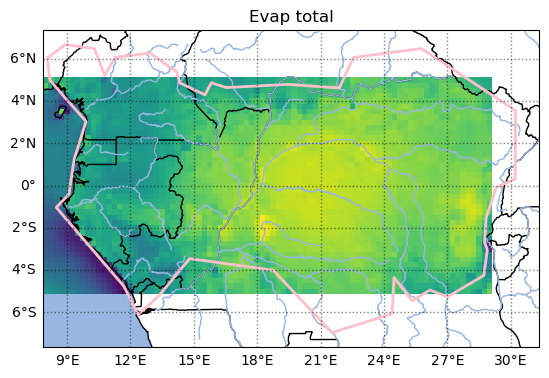

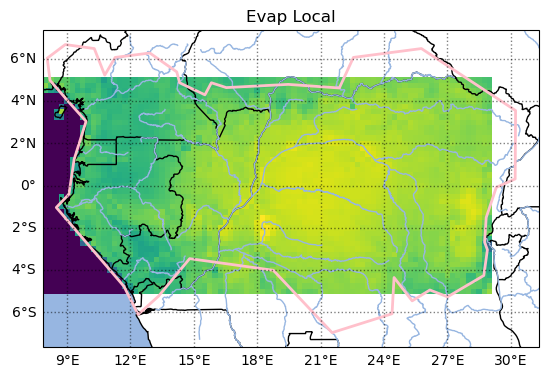

<Figure size 640x480 with 0 Axes>

In [8]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
ax.add_feature(cartopy.feature.RIVERS)
ax.add_feature(cartopy.feature.OCEAN)
#Overlay with all ward outline
shp_cod.plot(ax=ax, edgecolor='pink',facecolor='none',lw=2,zorder=2,linestyle='-')
#Plot data
Ea = np.transpose(np.average(E_total,axis=2))
collection = plt.pcolormesh(ds.lon, ds.lat,Ea)
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
ax.set_title("Evap total")
#plt.savefig()
plt.show()
plt.clf()

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS)
ax.add_feature(cartopy.feature.RIVERS)
ax.add_feature(cartopy.feature.OCEAN)
#Overlay with all ward outline
shp_cod.plot(ax=ax, edgecolor='pink',facecolor='none',lw=2,zorder=2,linestyle='-')
#Plot data
Ea = np.transpose(np.average(E_local,axis=2))
collection = plt.pcolormesh(ds.lon, ds.lat,Ea)
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='black', alpha=0.5, linestyle='dotted')
gl.top_labels = False
gl.right_labels = False
ax.set_title('Evap Local')
#plt.savefig()
plt.show()
plt.clf()

**Run recycling model for each timestep**
- Create recycling output array based on the shape of one of the surface input files: evap 
- Translate evap and fluxes to secondary grid
- Calculate modeled precipitation
- Plot scaled input variables (evap and fluxes)
- Run through each timestep in the input files and calculate recycling ratio at each timestep across domain
- Plot rho and convergence metric for each timestep

<Figure size 640x480 with 0 Axes>

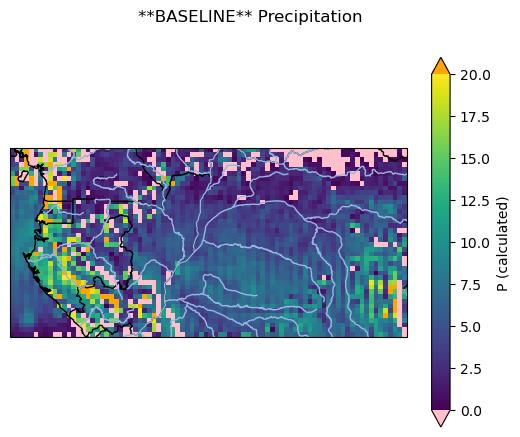

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 270 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 267 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 226 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 242 iterations


0 1990-01-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

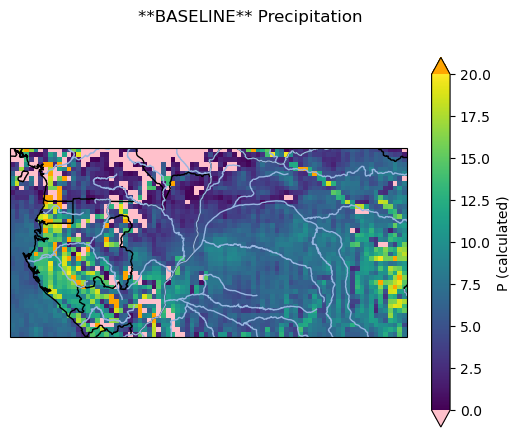

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 204 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 178 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 158 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 192 iterations


1 1990-02-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

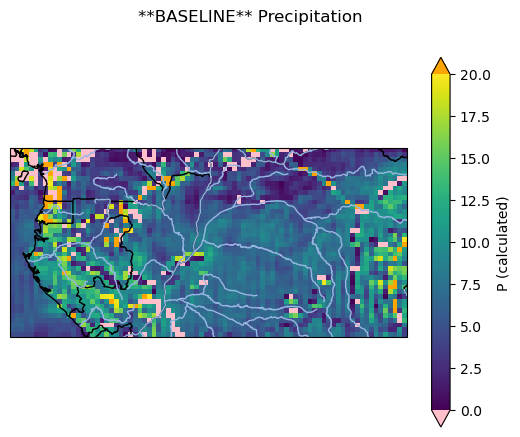

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 312 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 296 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 222 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 240 iterations


2 1990-03-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

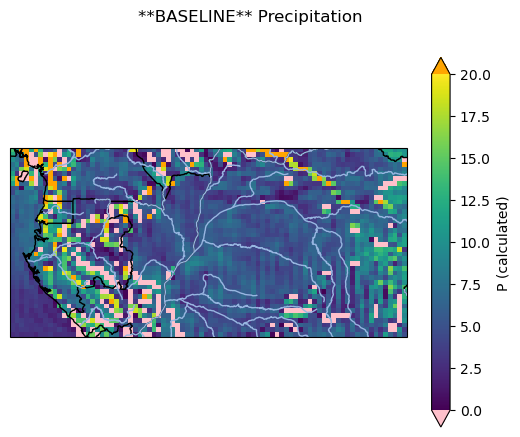

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 304 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 226 iterations


3 1990-04-01T00:00:00.000000000
0 True **pre-nudge
1 False **pre-nudge


<Figure size 640x480 with 0 Axes>

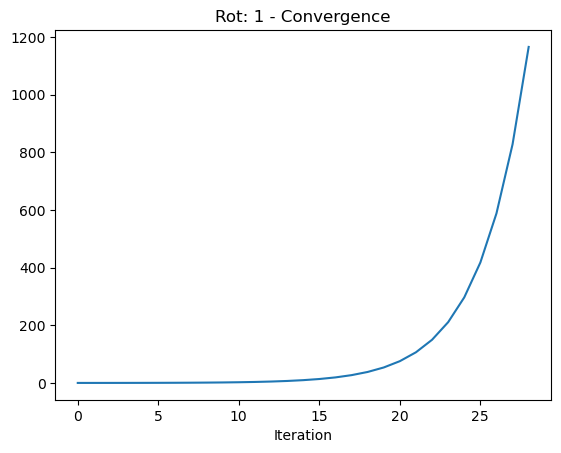

*There are  1  hot pixels*
Hottest pixel identified at (i=82, j=5) with instability heuristic = 3.4295717862632946
E = 3.4496896
P = -0.9001258817810651


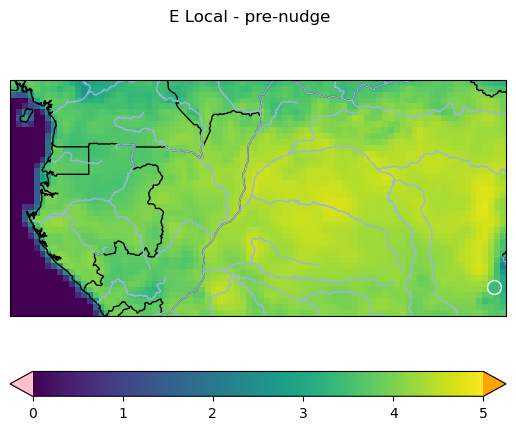

<Figure size 640x480 with 0 Axes>

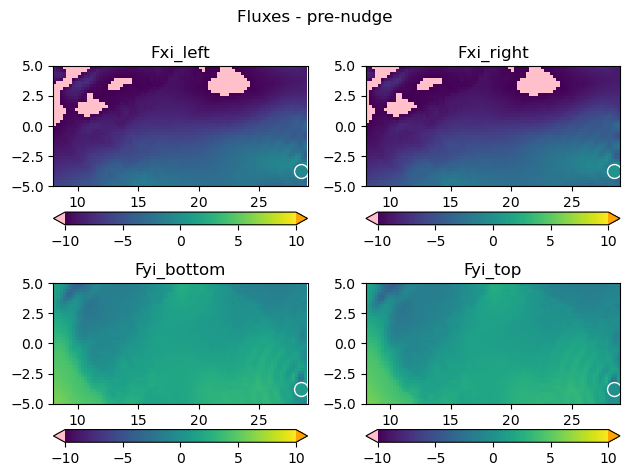

<Figure size 640x480 with 0 Axes>

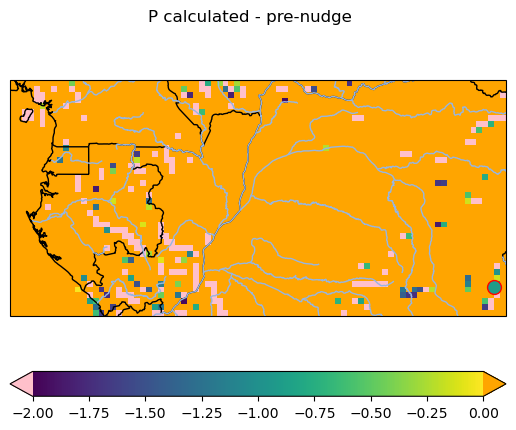

<Figure size 640x480 with 0 Axes>

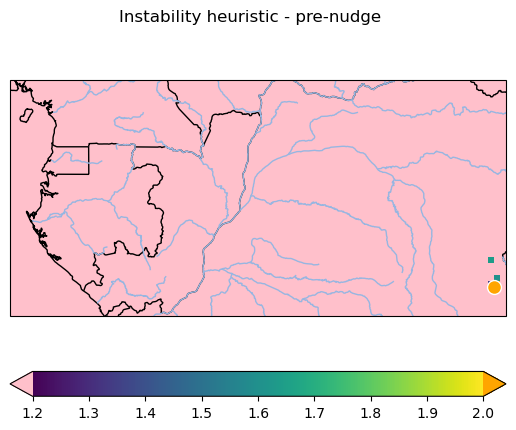

<Figure size 640x480 with 0 Axes>

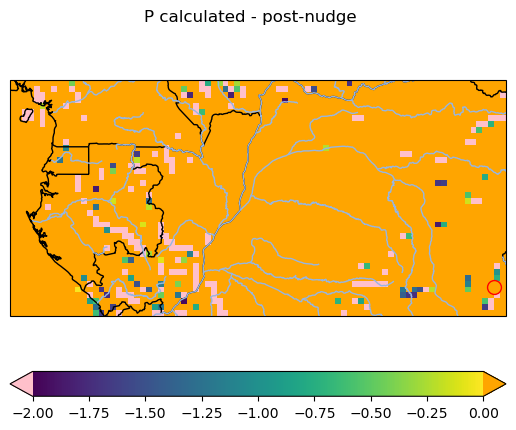

<Figure size 640x480 with 0 Axes>

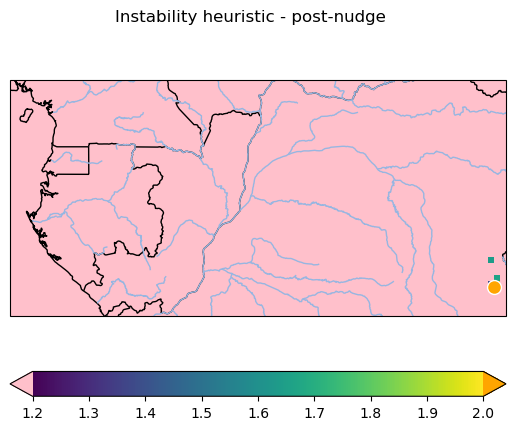

Hottest pixel post-nudge at (i=82, j=5) with instability heuristic = 13.961861008506258
E = 7.449689865112305
P = 3.099874356637514
3 1990-04-01T00:00:00.000000000
1 False **post-nudge


<Figure size 640x480 with 0 Axes>

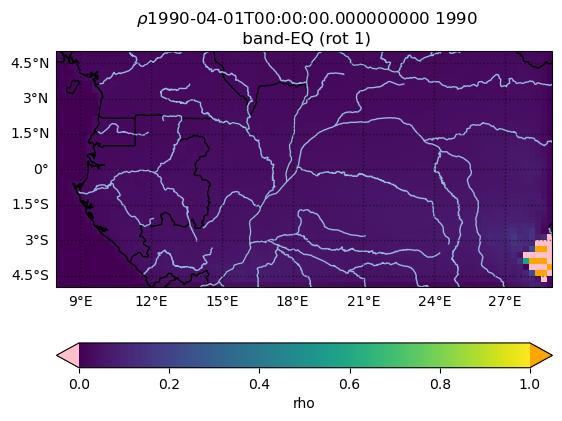

2 False **pre-nudge


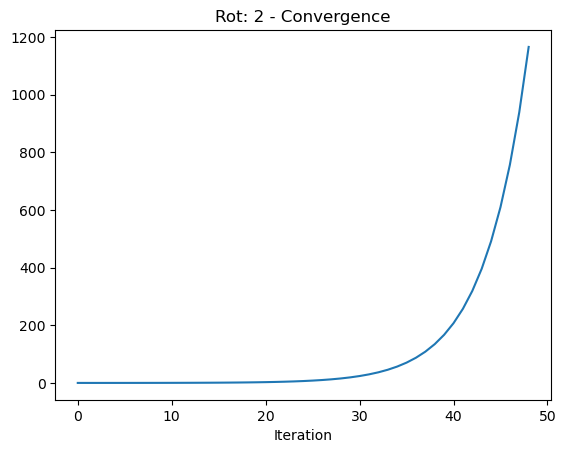

*There are  1  hot pixels*
Hottest pixel identified at (i=82, j=6) with instability heuristic = 2.0937813426607725
E = 3.5228841
P = -0.14593035452458025


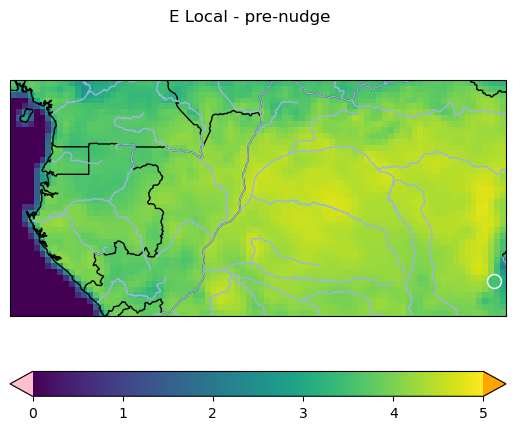

<Figure size 640x480 with 0 Axes>

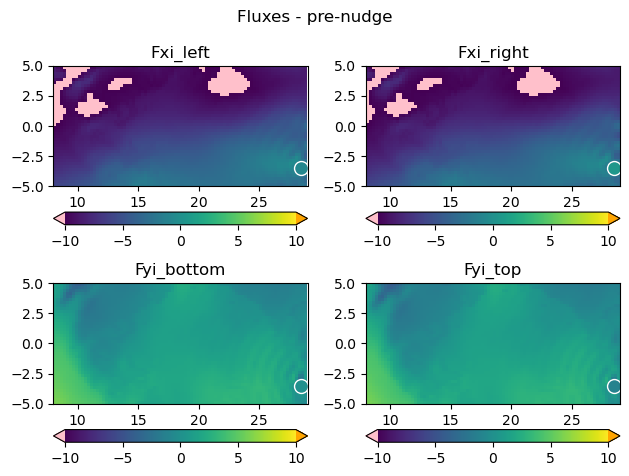

<Figure size 640x480 with 0 Axes>

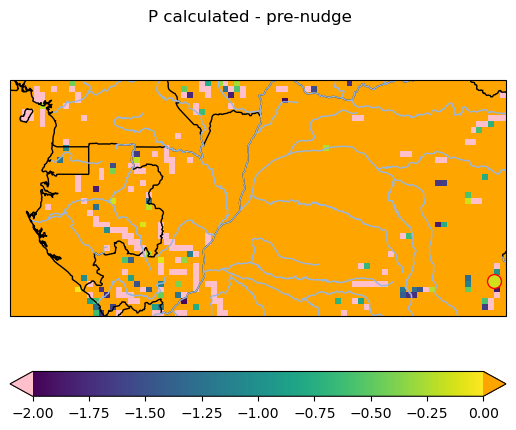

<Figure size 640x480 with 0 Axes>

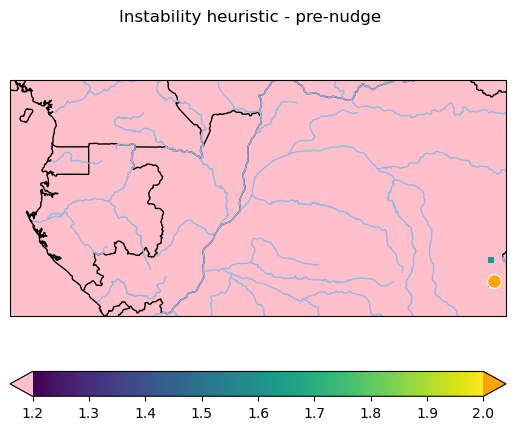

<Figure size 640x480 with 0 Axes>

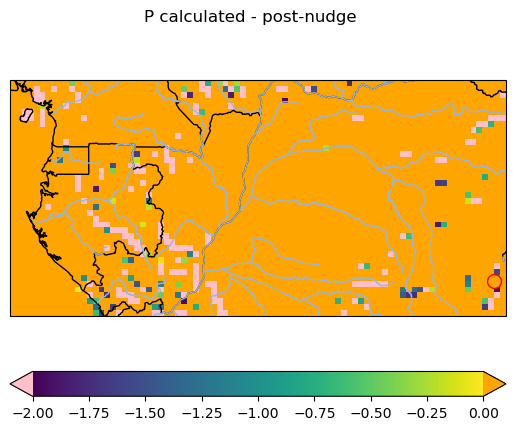

<Figure size 640x480 with 0 Axes>

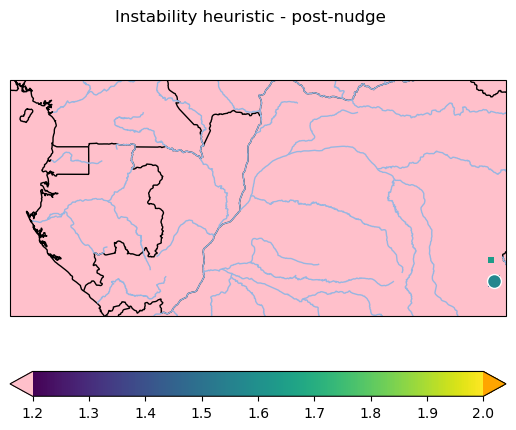

Hottest pixel post-nudge at (i=82, j=6) with instability heuristic = 1.5705367611215533
E = 7.522884368896484
P = 3.854069883893999


3 1990-04-01T00:00:00.000000000
2 False **post-nudge


<Figure size 640x480 with 0 Axes>

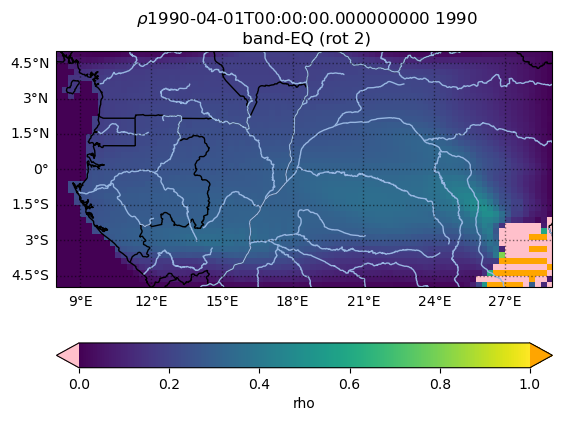

3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

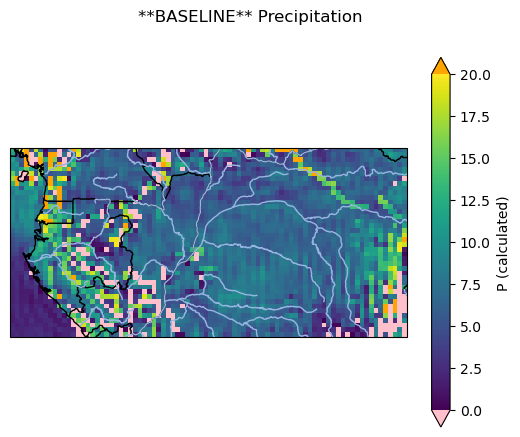

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 308 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 331 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 259 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 232 iterations


4 1990-05-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

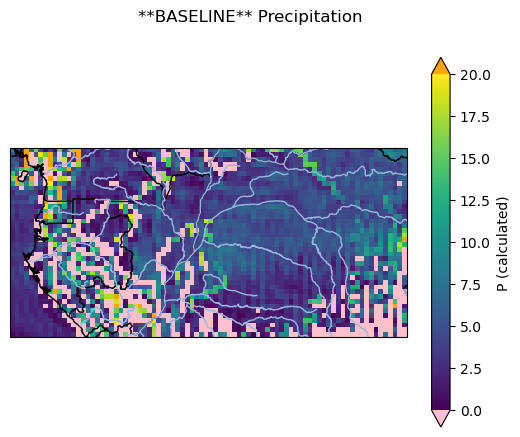

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 316 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 240 iterations


5 1990-06-01T00:00:00.000000000
0 True **pre-nudge
1 False **pre-nudge


<Figure size 640x480 with 0 Axes>

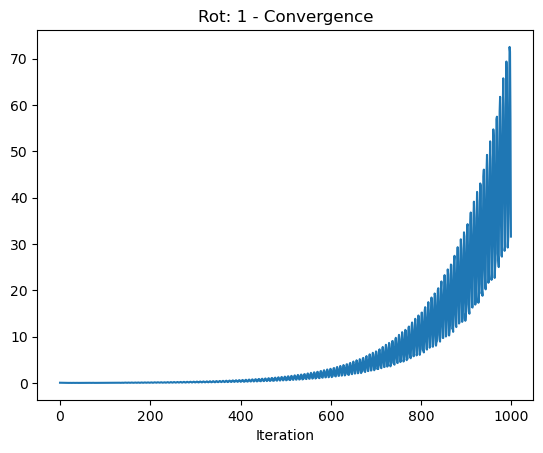

*There are  1  hot pixels*
Hottest pixel identified at (i=82, j=6) with instability heuristic = 3.749226141446972
E = 3.1717494
P = -13.497783721235756


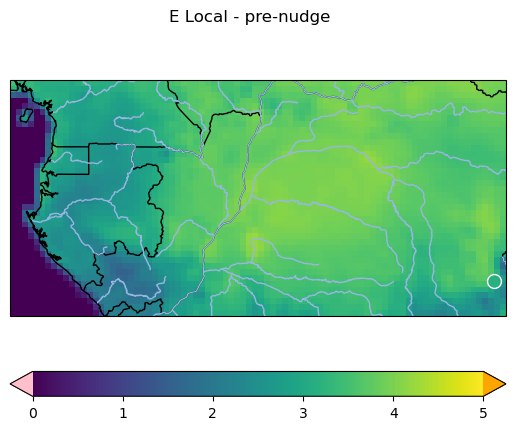

<Figure size 640x480 with 0 Axes>

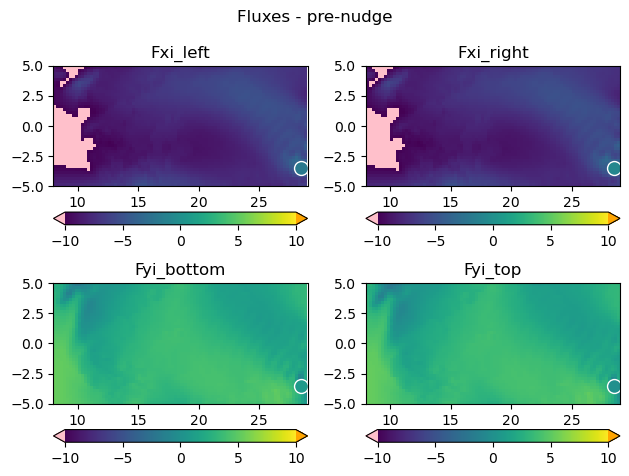

<Figure size 640x480 with 0 Axes>

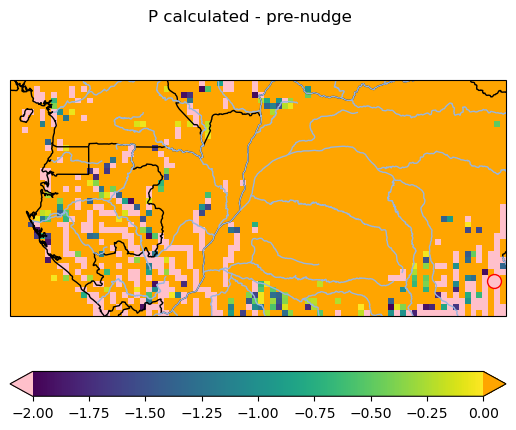

<Figure size 640x480 with 0 Axes>

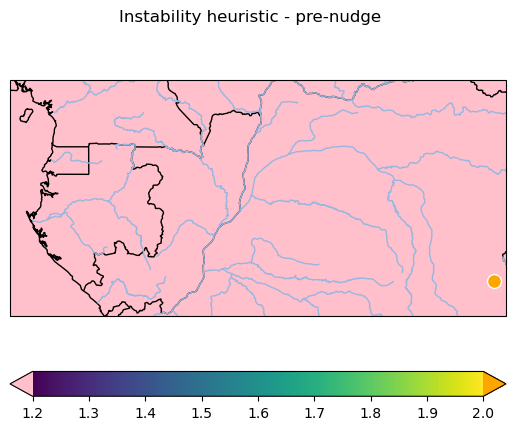

<Figure size 640x480 with 0 Axes>

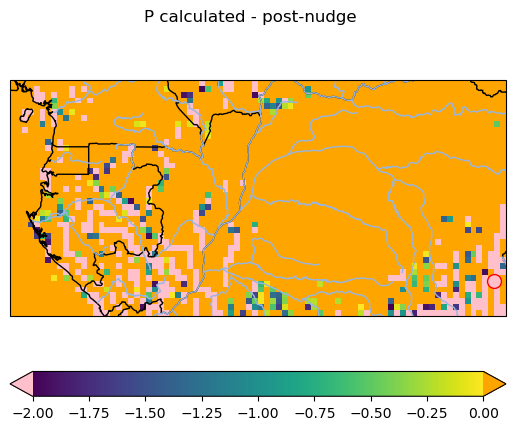

<Figure size 640x480 with 0 Axes>

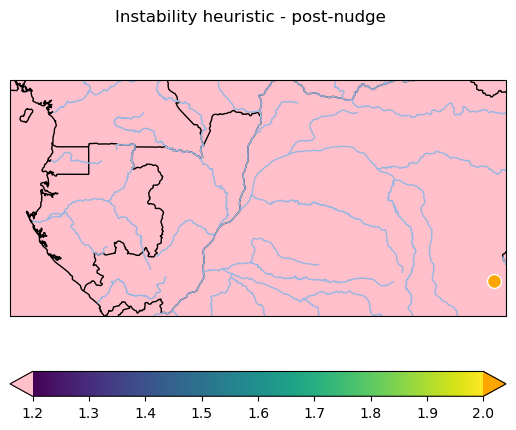

Hottest pixel post-nudge at (i=82, j=6) with instability heuristic = 2.7150042588951124
E = 7.171749114990234
P = -9.497783959654335


INFO:bulk_recycling_model.main:Converged in 345 iterations


5 1990-06-01T00:00:00.000000000
1 True **post-nudge
2 False **pre-nudge


<Figure size 640x480 with 0 Axes>

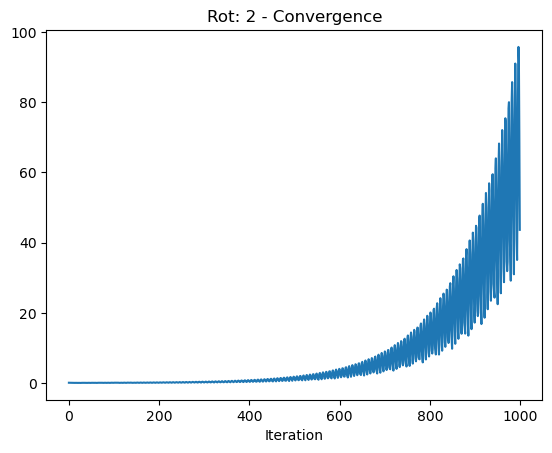

*There are  1  hot pixels*
Hottest pixel identified at (i=82, j=6) with instability heuristic = 3.749226141446972
E = 3.1717494
P = -13.497783721235756


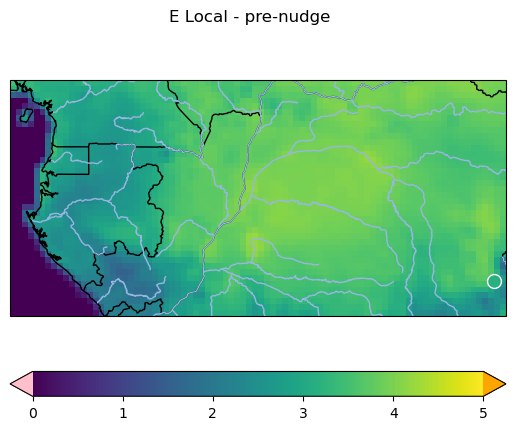

<Figure size 640x480 with 0 Axes>

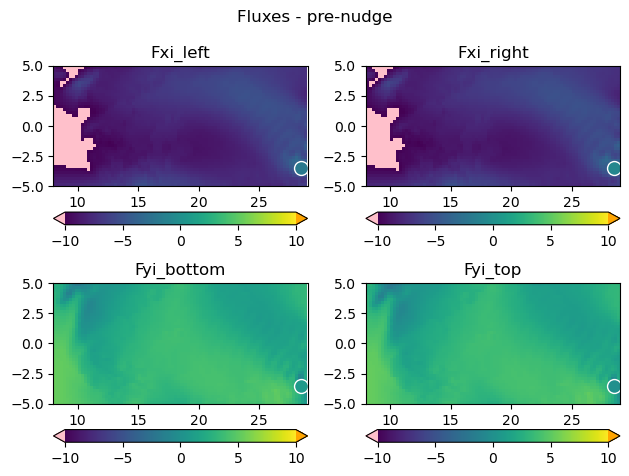

<Figure size 640x480 with 0 Axes>

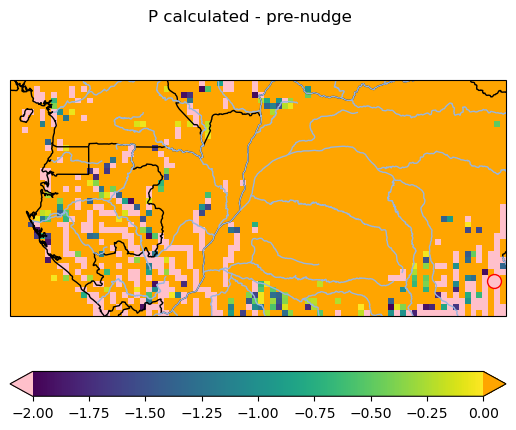

<Figure size 640x480 with 0 Axes>

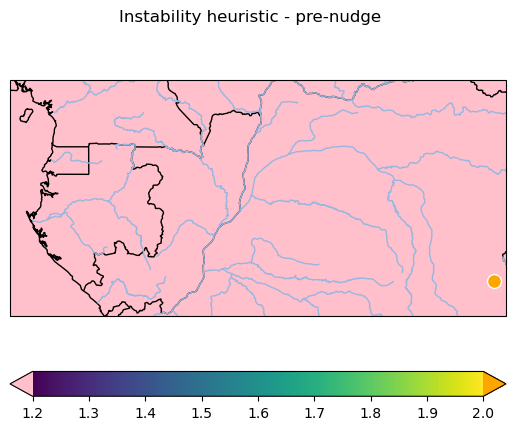

<Figure size 640x480 with 0 Axes>

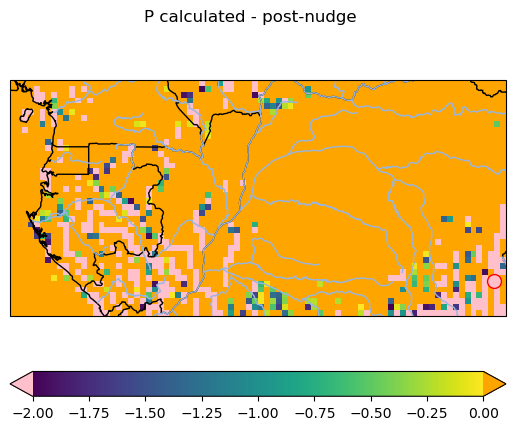

<Figure size 640x480 with 0 Axes>

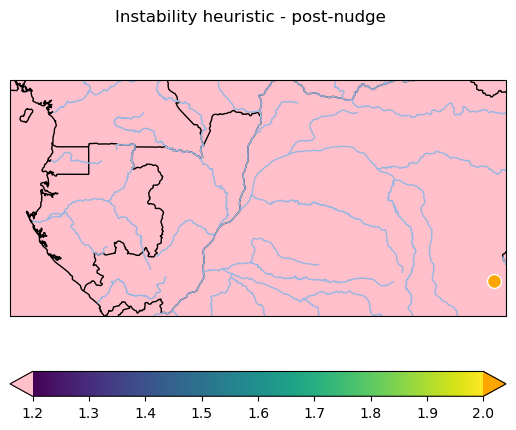

Hottest pixel post-nudge at (i=82, j=6) with instability heuristic = 2.715004258895113
E = 7.171749114990234
P = -9.497783959654335


INFO:bulk_recycling_model.main:Converged in 304 iterations


5 1990-06-01T00:00:00.000000000
2 True **post-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

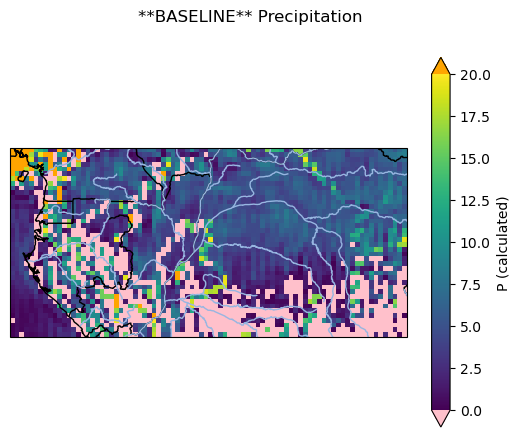

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 272 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees


6 1990-07-01T00:00:00.000000000
0 False **pre-nudge


<Figure size 640x480 with 0 Axes>

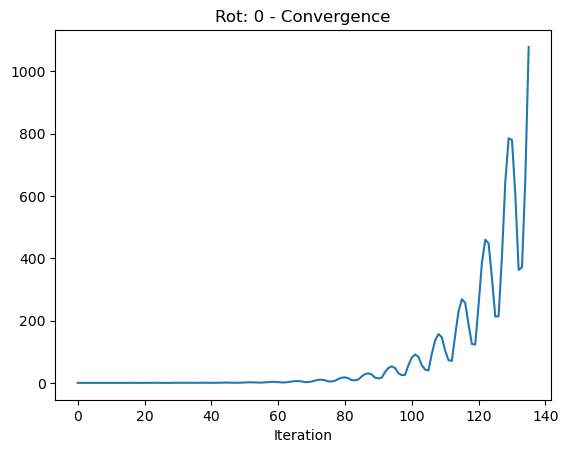

*There are  2  hot pixels*
Hottest pixel identified at (i=12, j=33) with instability heuristic = 7.1099780806267825
E = 2.1990426
P = -3.757744602045289


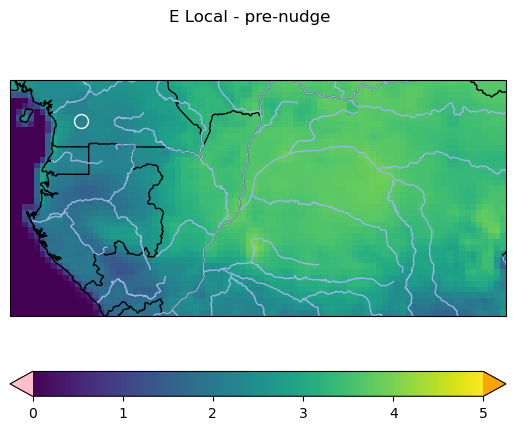

<Figure size 640x480 with 0 Axes>

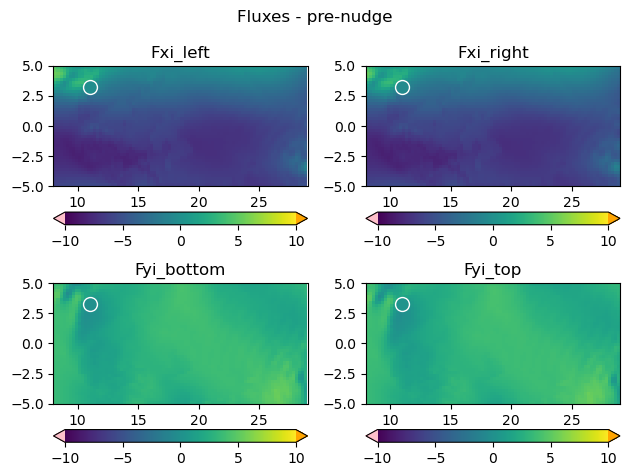

<Figure size 640x480 with 0 Axes>

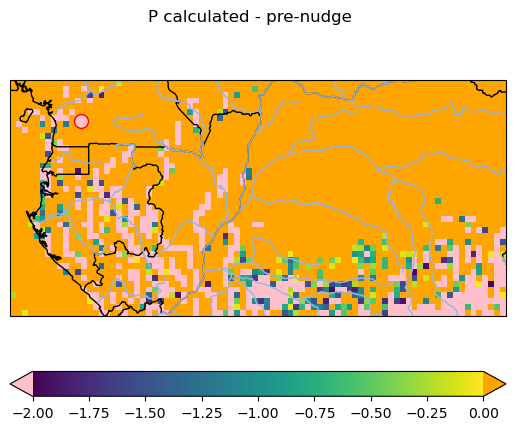

<Figure size 640x480 with 0 Axes>

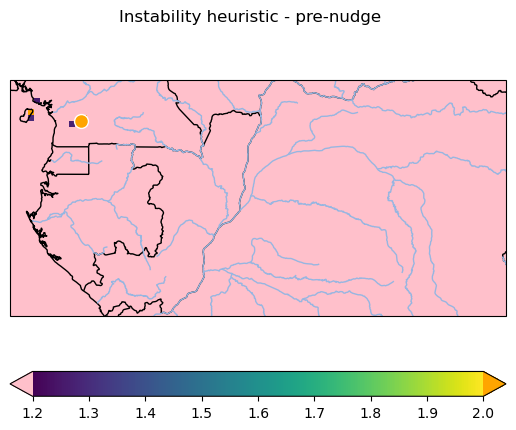

<Figure size 640x480 with 0 Axes>

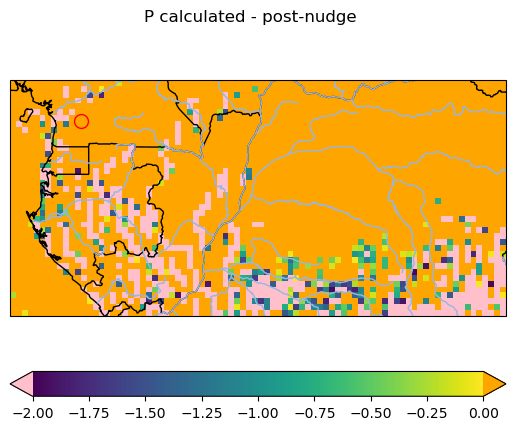

<Figure size 640x480 with 0 Axes>

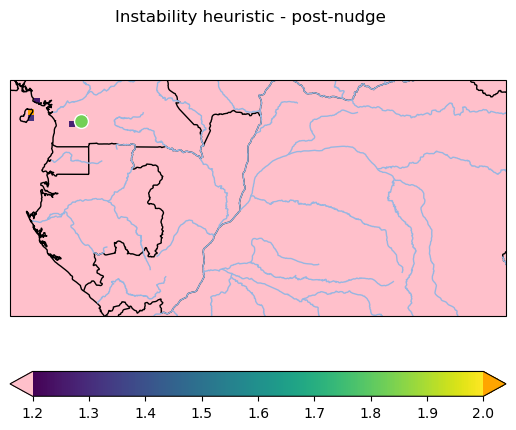

Hottest pixel post-nudge at (i=12, j=33) with instability heuristic = 1.8287464332997687
E = 6.199042558670044
P = 0.24225539795471107
6 1990-07-01T00:00:00.000000000
0 False **post-nudge


<Figure size 640x480 with 0 Axes>

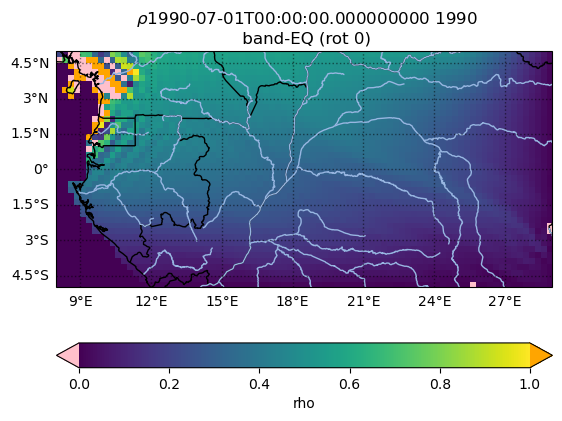

1 False **pre-nudge


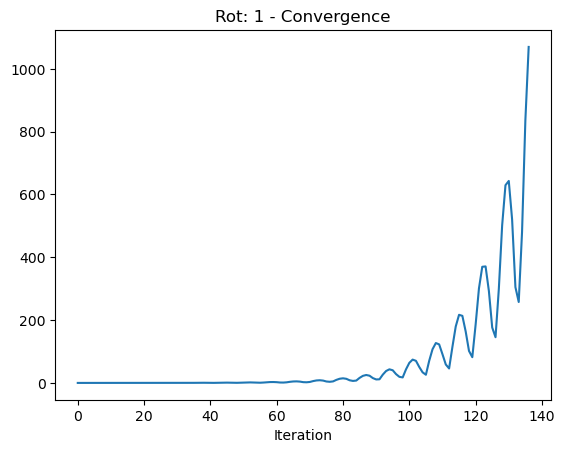

*There are  1  hot pixels*
Hottest pixel identified at (i=3, j=34) with instability heuristic = 4.366164353185687
E = 1.1258069
P = -17.905239748176445


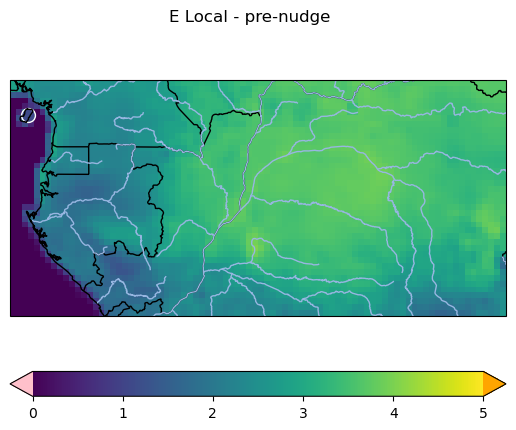

<Figure size 640x480 with 0 Axes>

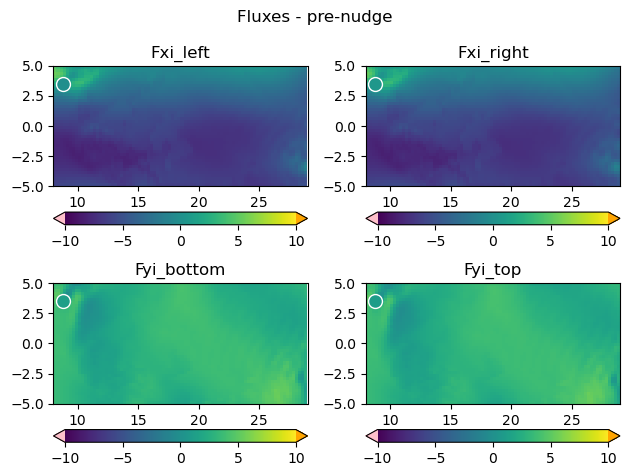

<Figure size 640x480 with 0 Axes>

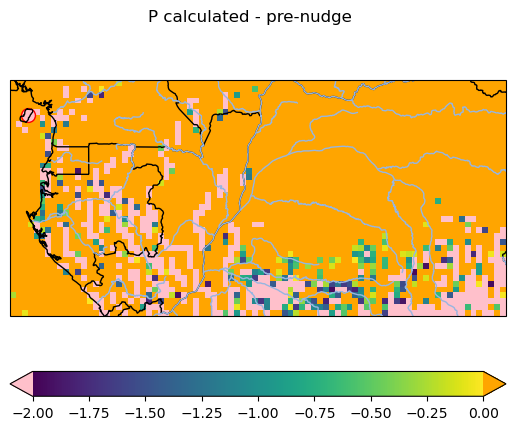

<Figure size 640x480 with 0 Axes>

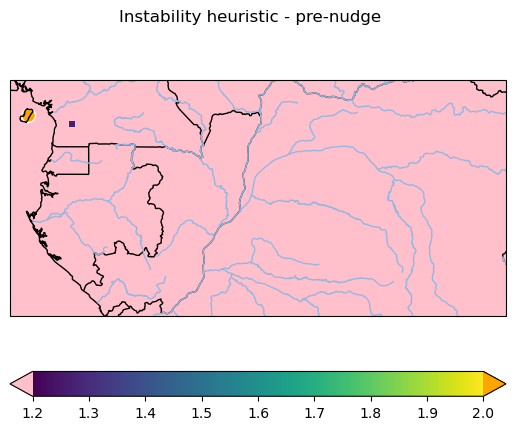

<Figure size 640x480 with 0 Axes>

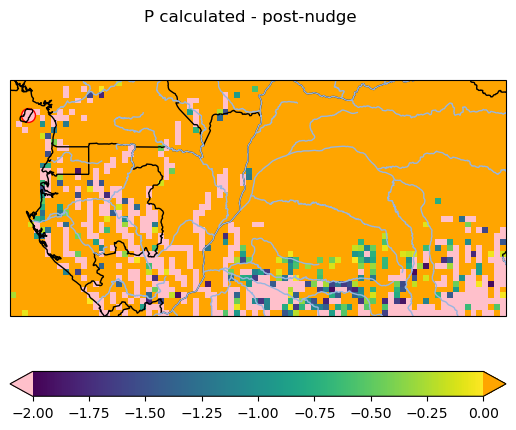

<Figure size 640x480 with 0 Axes>

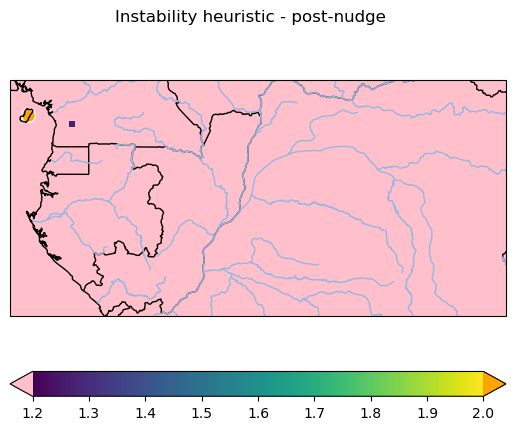

Hottest pixel post-nudge at (i=3, j=34) with instability heuristic = 2.56498596426137
E = 5.12580680847168
P = -13.905239986595024
6 1990-07-01T00:00:00.000000000
1 False **post-nudge


<Figure size 640x480 with 0 Axes>

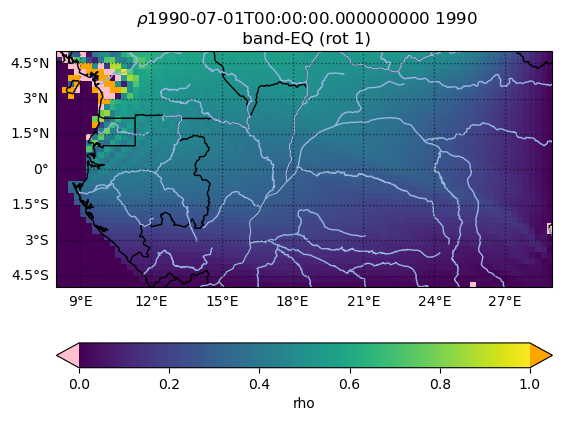

2 True **pre-nudge
3 False **pre-nudge


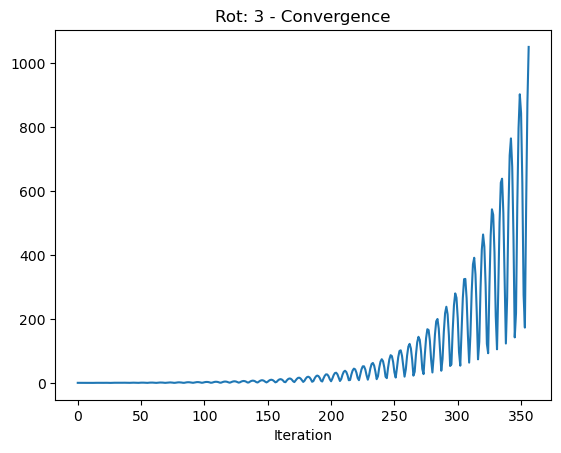

*There are  1  hot pixels*
Hottest pixel identified at (i=12, j=33) with instability heuristic = 7.1099780806267825
E = 2.1990426
P = -3.757744602045289


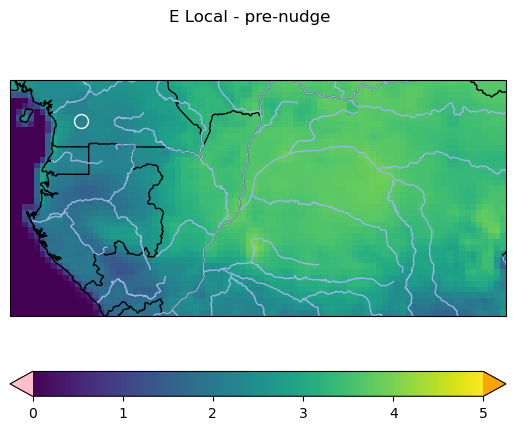

<Figure size 640x480 with 0 Axes>

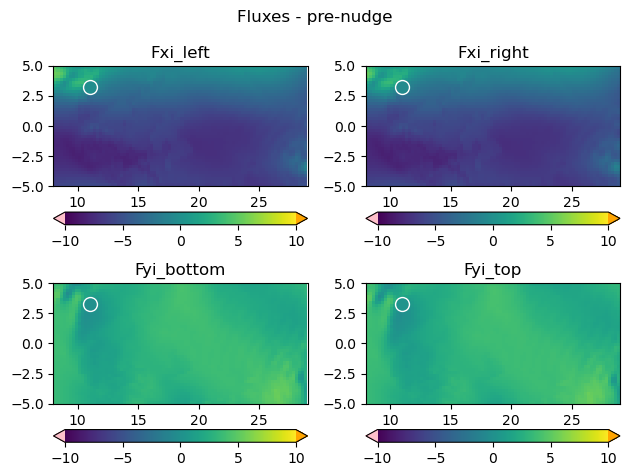

<Figure size 640x480 with 0 Axes>

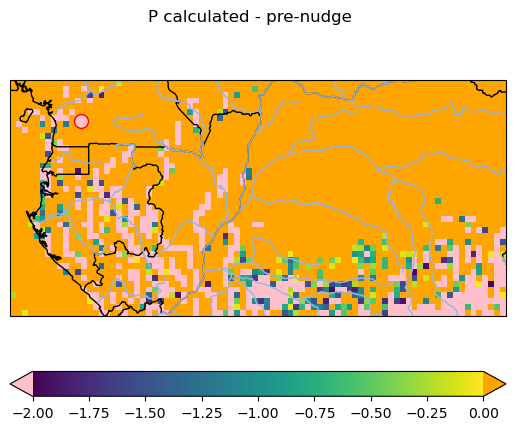

<Figure size 640x480 with 0 Axes>

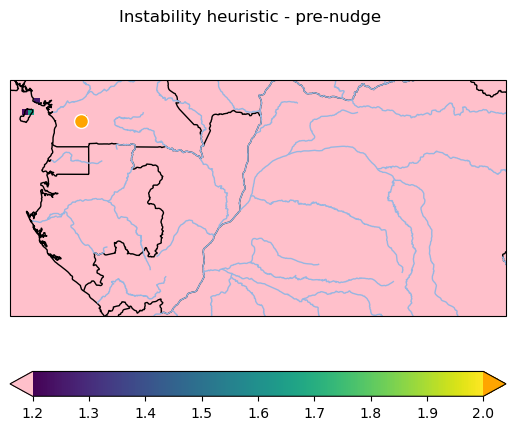

<Figure size 640x480 with 0 Axes>

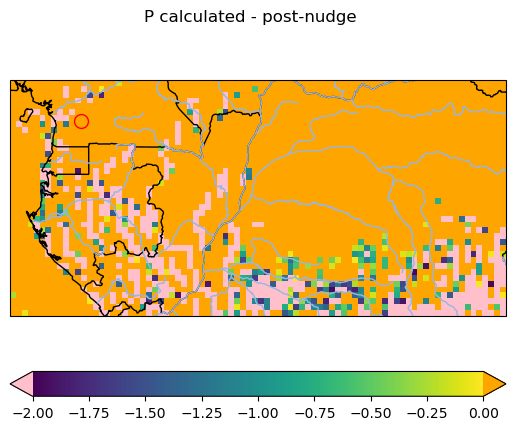

<Figure size 640x480 with 0 Axes>

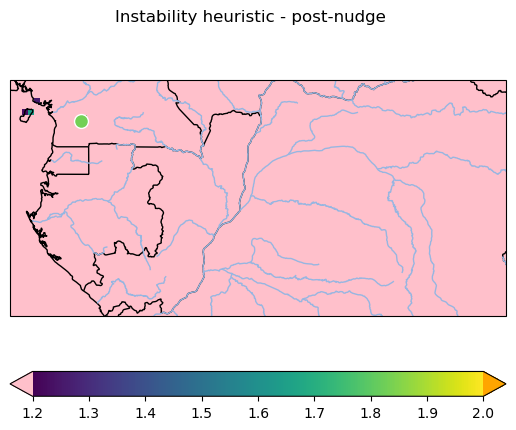

Hottest pixel post-nudge at (i=12, j=33) with instability heuristic = 1.8287465142653747
E = 6.199042320251465
P = 0.24225515953613197


INFO:bulk_recycling_model.main:Converged in 480 iterations


6 1990-07-01T00:00:00.000000000
3 True **post-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

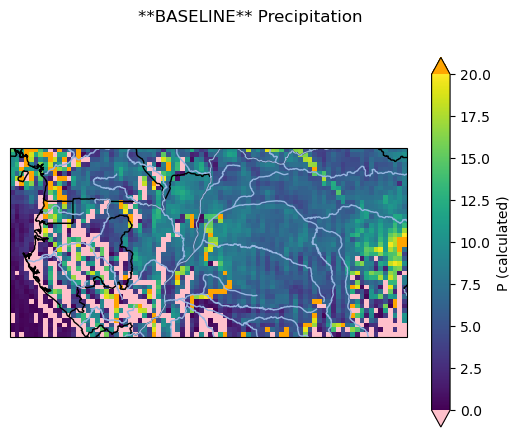

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 279 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 303 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 266 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 242 iterations


7 1990-08-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

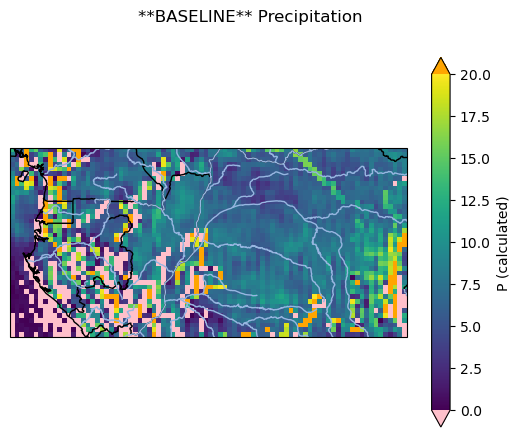

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees


8 1990-09-01T00:00:00.000000000
0 False **pre-nudge


<Figure size 640x480 with 0 Axes>

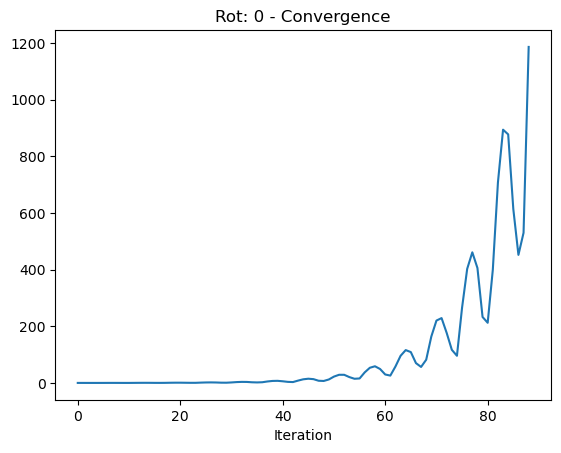

*There are  3  hot pixels*
Hottest pixel identified at (i=5, j=33) with instability heuristic = 5.175926150896807
E = 0.0
P = 0.12329387074198905


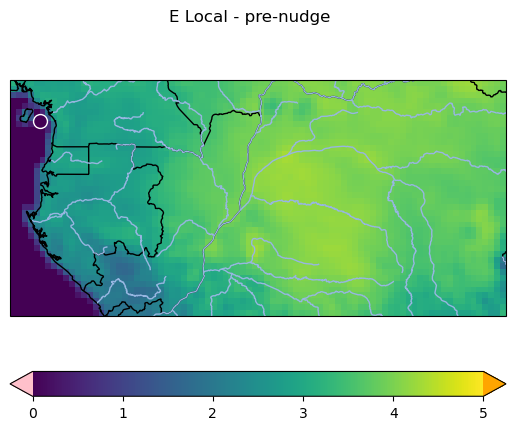

<Figure size 640x480 with 0 Axes>

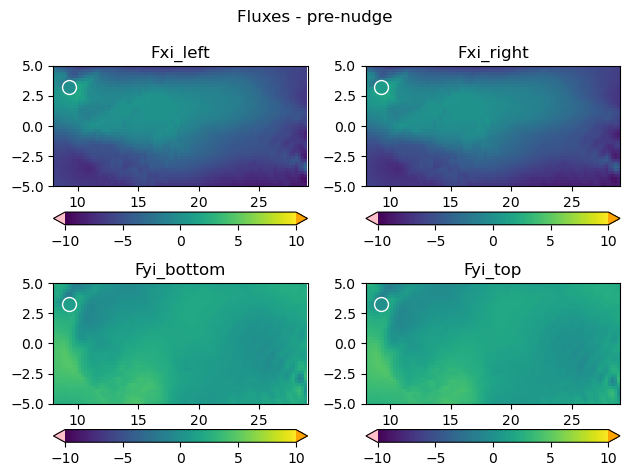

<Figure size 640x480 with 0 Axes>

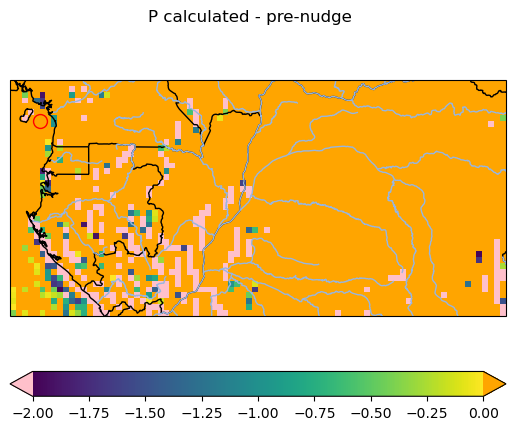

<Figure size 640x480 with 0 Axes>

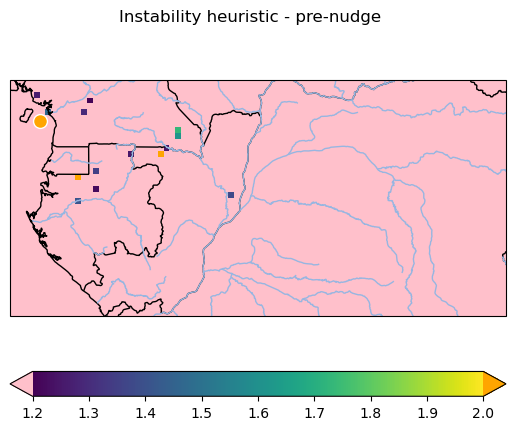

<Figure size 640x480 with 0 Axes>

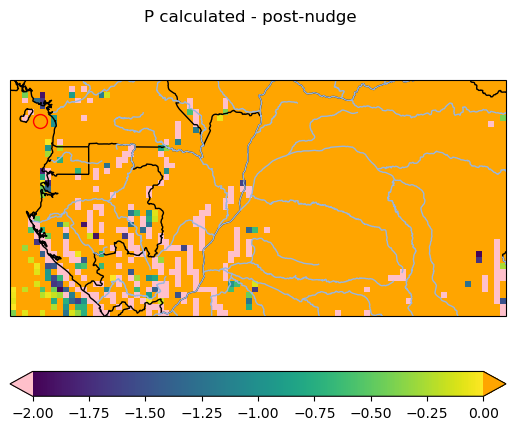

<Figure size 640x480 with 0 Axes>

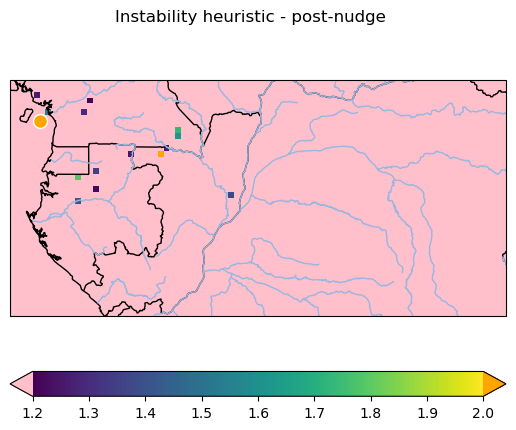

Hottest pixel post-nudge at (i=5, j=33) with instability heuristic = 2.7657386990185153
E = 4.0
P = 4.123294109160568


8 1990-09-01T00:00:00.000000000
0 False **post-nudge


<Figure size 640x480 with 0 Axes>

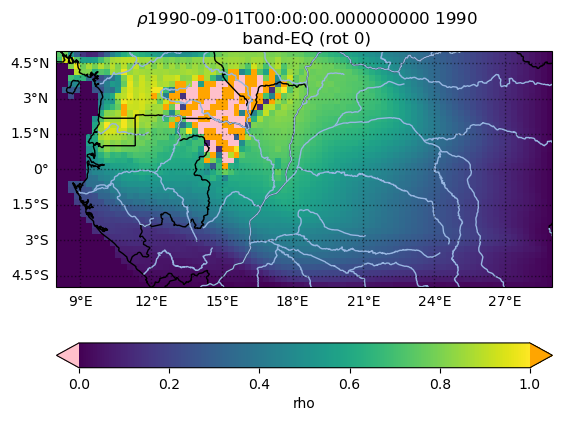

1 False **pre-nudge


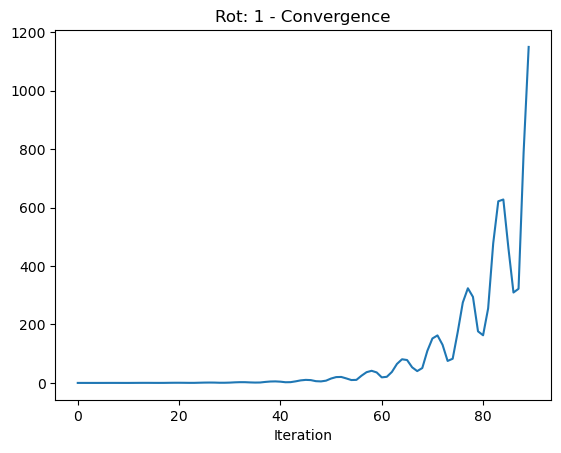

*There are  2  hot pixels*
Hottest pixel identified at (i=25, j=27) with instability heuristic = 4.162718354025274
E = 3.0495636
P = -17.26931853636149


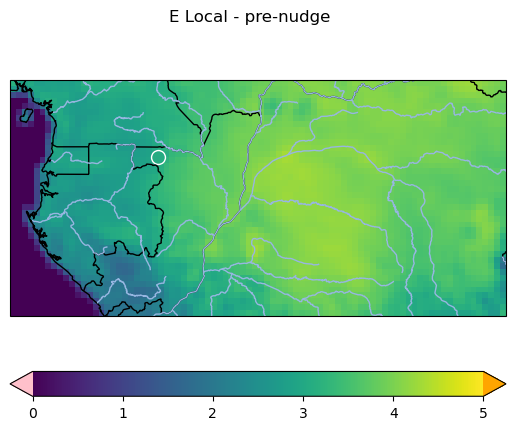

<Figure size 640x480 with 0 Axes>

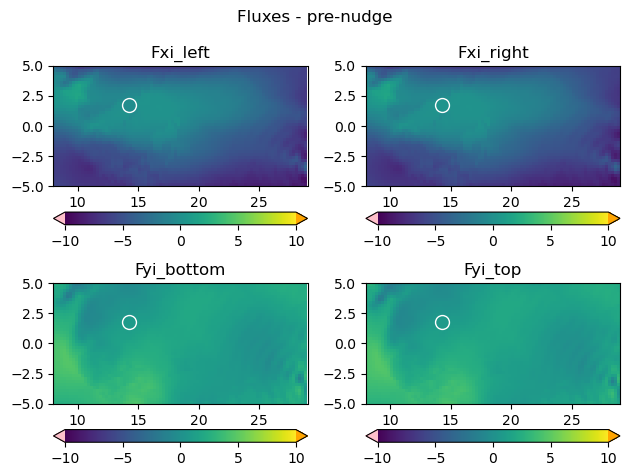

<Figure size 640x480 with 0 Axes>

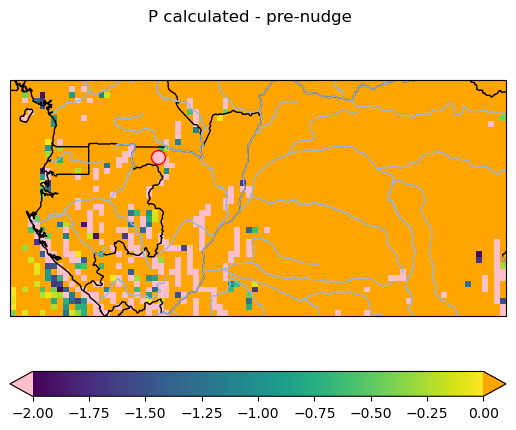

<Figure size 640x480 with 0 Axes>

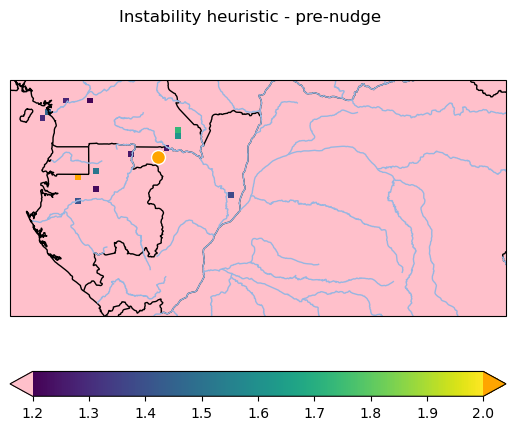

<Figure size 640x480 with 0 Axes>

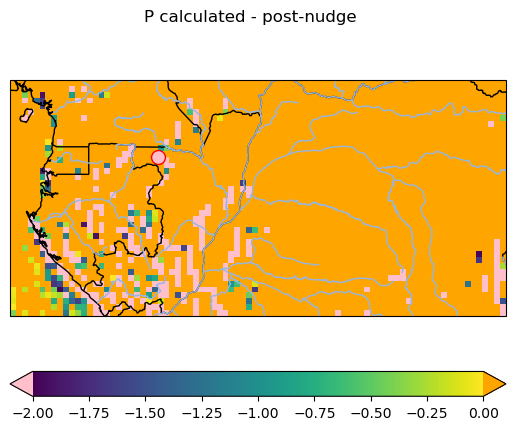

<Figure size 640x480 with 0 Axes>

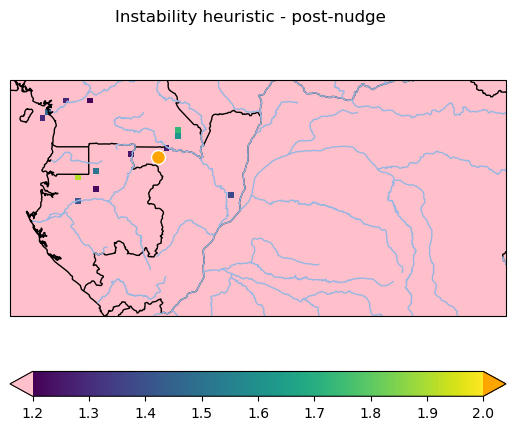

Hottest pixel post-nudge at (i=25, j=27) with instability heuristic = 2.2274719448069926
E = 7.049563646316528
P = -13.269318536361487


8 1990-09-01T00:00:00.000000000
1 False **post-nudge


<Figure size 640x480 with 0 Axes>

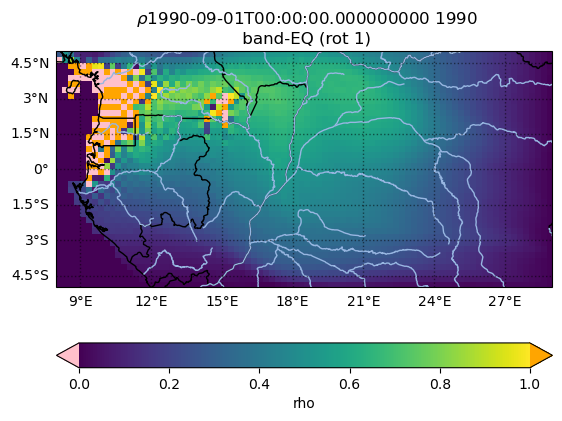

2 False **pre-nudge


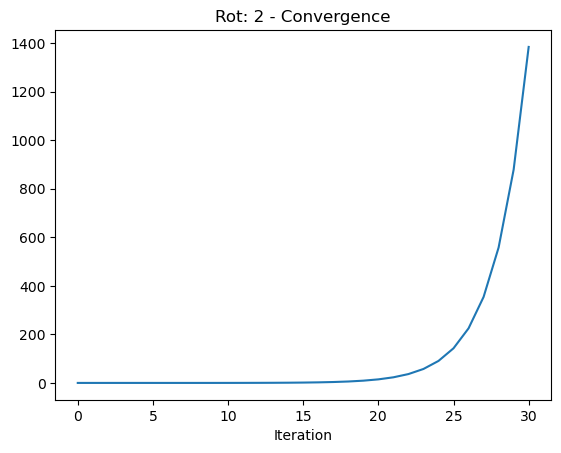

*There are  4  hot pixels*
Hottest pixel identified at (i=5, j=33) with instability heuristic = 6.972910760601868
E = 0.0
P = 0.12329387074198905


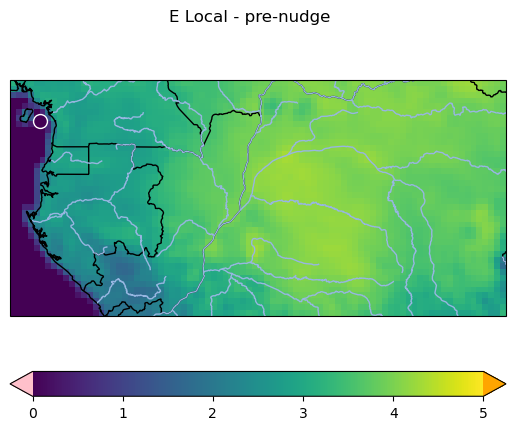

<Figure size 640x480 with 0 Axes>

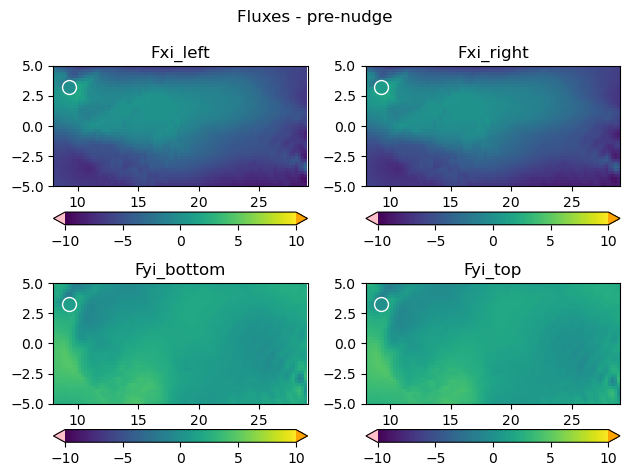

<Figure size 640x480 with 0 Axes>

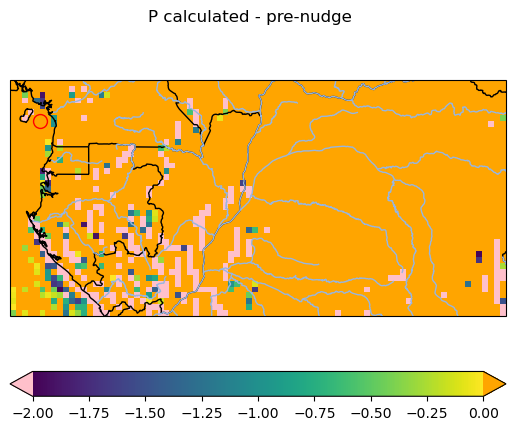

<Figure size 640x480 with 0 Axes>

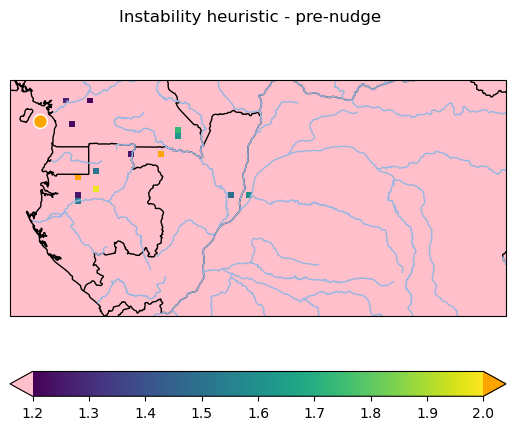

<Figure size 640x480 with 0 Axes>

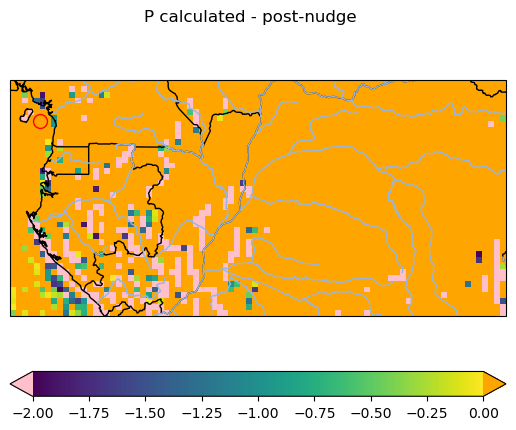

<Figure size 640x480 with 0 Axes>

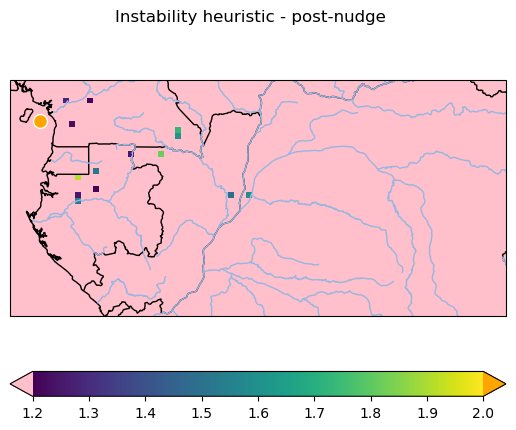

Hottest pixel post-nudge at (i=5, j=33) with instability heuristic = 40.07568562957523
E = 4.0
P = 4.123294109160568
8 1990-09-01T00:00:00.000000000
2 False **post-nudge


<Figure size 640x480 with 0 Axes>

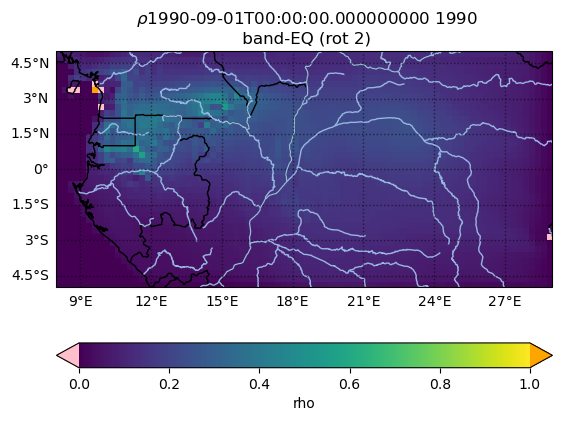

3 False **pre-nudge


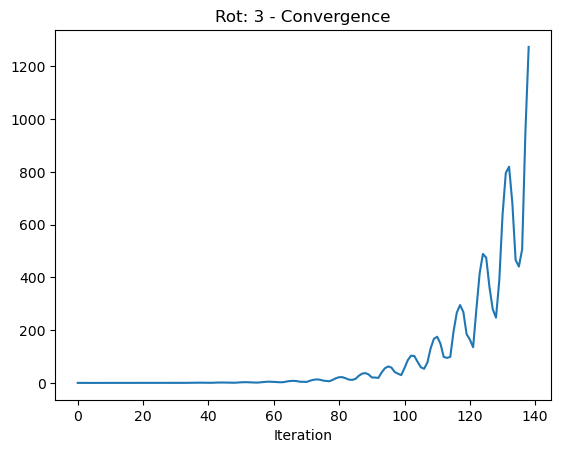

*There are  4  hot pixels*
Hottest pixel identified at (i=10, j=32) with instability heuristic = 4.7015765152787115
E = 2.8241389
P = 14.279738364953964


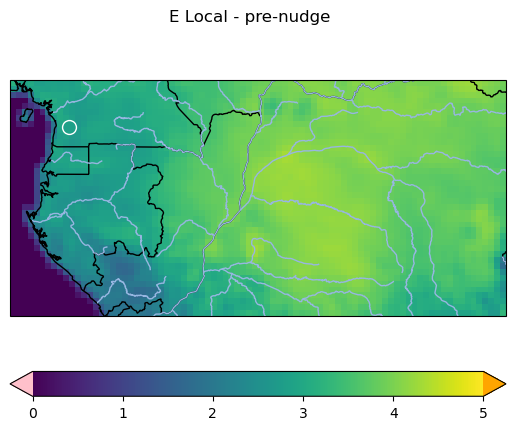

<Figure size 640x480 with 0 Axes>

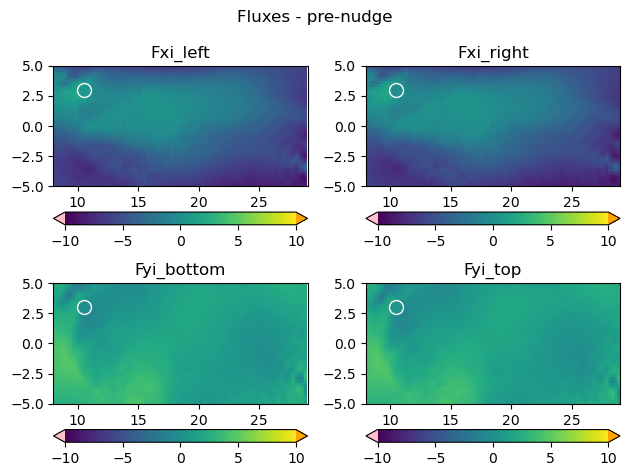

<Figure size 640x480 with 0 Axes>

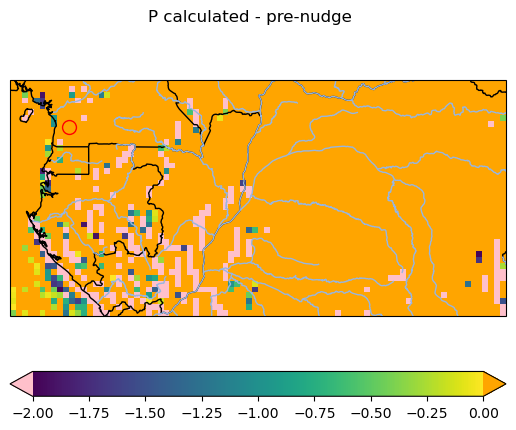

<Figure size 640x480 with 0 Axes>

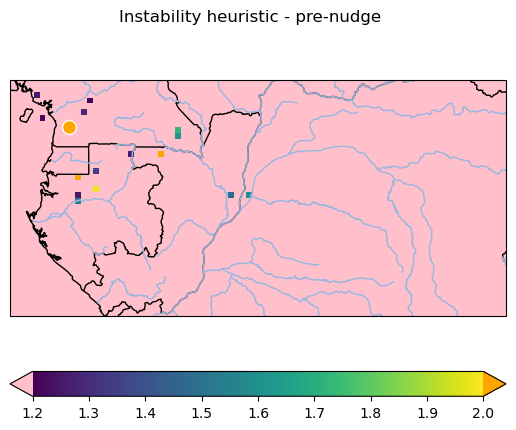

<Figure size 640x480 with 0 Axes>

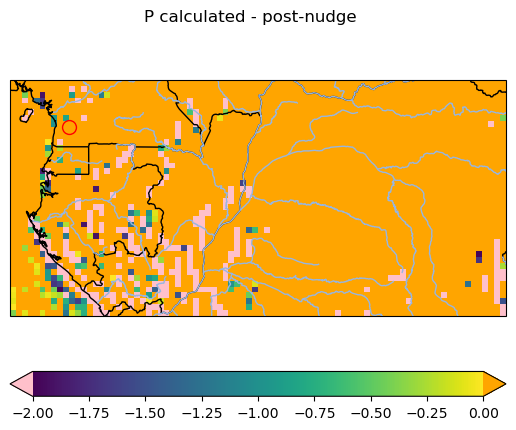

<Figure size 640x480 with 0 Axes>

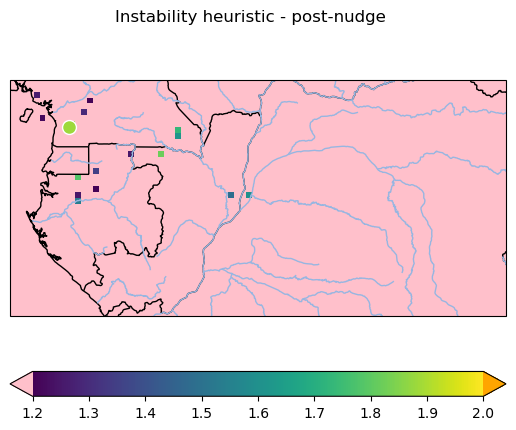

Hottest pixel post-nudge at (i=10, j=32) with instability heuristic = 1.882615778407949
E = 6.824138641357422
P = 18.279738126535385


8 1990-09-01T00:00:00.000000000
3 False **post-nudge


<Figure size 640x480 with 0 Axes>

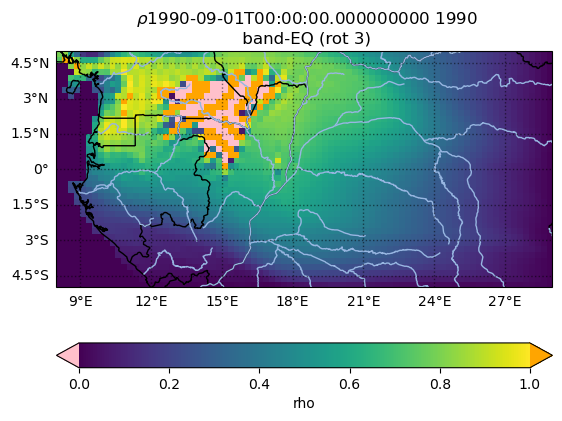

<Figure size 640x480 with 0 Axes>

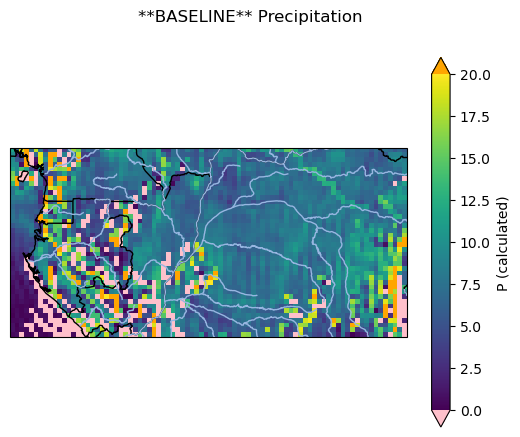

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 291 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 281 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 243 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 226 iterations


9 1990-10-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

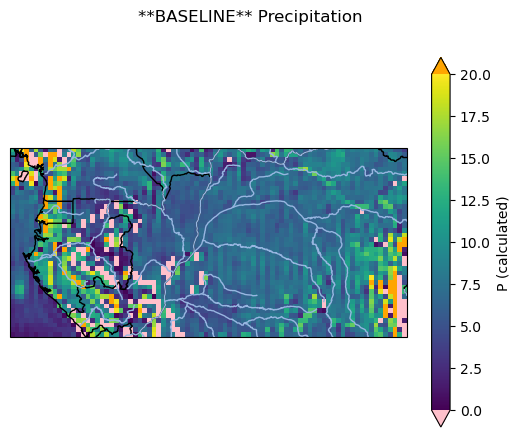

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 289 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 280 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 202 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 213 iterations


10 1990-11-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

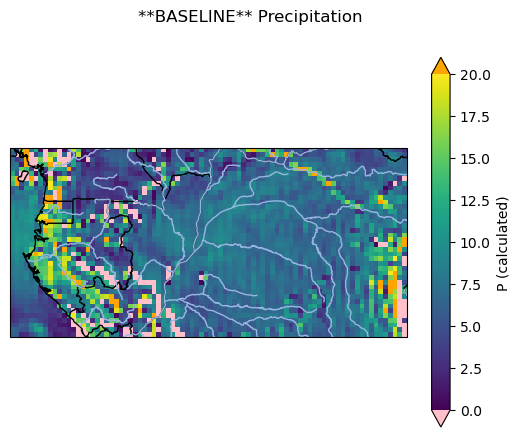

INFO:bulk_recycling_model.main:Attempt 1 of 4 with rotation of 0 degrees
INFO:bulk_recycling_model.main:Converged in 304 iterations
INFO:bulk_recycling_model.main:Attempt 2 of 4 with rotation of 90 degrees
INFO:bulk_recycling_model.main:Converged in 293 iterations
INFO:bulk_recycling_model.main:Attempt 3 of 4 with rotation of 180 degrees
INFO:bulk_recycling_model.main:Converged in 219 iterations
INFO:bulk_recycling_model.main:Attempt 4 of 4 with rotation of 270 degrees
INFO:bulk_recycling_model.main:Converged in 233 iterations


11 1990-12-01T00:00:00.000000000
0 True **pre-nudge
1 True **pre-nudge
2 True **pre-nudge
3 True **pre-nudge
count_success_pre_nudge:  37
count_fail_pre_nudge:  11
count_success_post_nudge:  3
count_fail_post_nudge:  8
count_fail_no_hot_pixel:  0
count_fail_too_many_pixels:  0


<Figure size 640x480 with 0 Axes>

In [9]:
import matplotlib.pyplot as plt
import logging
logging.basicConfig()
logging.getLogger("bulk_recycling_model").setLevel(logging.INFO)
from bulk_recycling_model import plotting
from bulk_recycling_model.main import run_4_orientations, run_rotated
from bulk_recycling_model import coefficients

max_iter = 1000
tol = 1e-3

#Make the rho array the same shape as the total E - will clip the external points at the end
rho_ar = np.empty((4,np.shape(E_total)[0]-1,np.shape(E_total)[1]-1,np.shape(E_total)[2]))
#Entering preprocessing and time step loop
#Run model and plot
count_success_pre_nudge = 0
count_success_post_nudge = 0
count_fail_pre_nudge = 0
count_fail_post_nudge = 0
too_many_pixels = 0
no_hot_pixel = 0
for i,time in enumerate(ds.time):
     
    # preprocess E onto the secondary grid
    Ei_total = preprocess.prepare_E(E_total[:,:,i])
    Ei_local = preprocess.prepare_E(E_local[:,:,i])
    
    #print('post-processed land min',Ei_local.min())
    #print('post-processed total min',Ei_total.min())
    
    # preprocess water vapor fluxes onto the secondary grid
    Fxi_left = preprocess.prepare_Fx_left(Fx[:,:,i])
    Fxi_right = preprocess.prepare_Fx_right(Fx[:,:,i])
    Fyi_bottom = preprocess.prepare_Fy_bottom(Fy[:,:,i])
    Fyi_top = preprocess.prepare_Fy_top(Fy[:,:,i])
    
    # compute P
    Pi = preprocess.calculate_precipitation(Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, Ei_total, dx, dy)

    # Create a quiver plot
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS)
    ax.add_feature(cartopy.feature.RIVERS)
    ax.add_feature(cartopy.feature.OCEAN)
    collection = plotting.pcolormesh(ax, Ei_local, lon_axis, lat_axis, alpha=0.5)
    fig.colorbar(collection, label="E (scaled)")
    plotting.quiver(ax, Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, lon_axis, lat_axis)
    fig.suptitle("Evaporation + Water Vapor Fluxes on cell edges")
    #plt.show()
    plt.clf()
    
    # Create a precip plot
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS)
    ax.add_feature(cartopy.feature.RIVERS)
    ax.add_feature(cartopy.feature.OCEAN)
    cmap=plt.cm.viridis
    cmap.set_extremes(over='orange')
    cmap.set_extremes(under='pink')
    collection = plotting.pcolormesh(ax, Pi, lon_axis, lat_axis, 
                                     alpha=1,cmap=cmap,
                                     vmin=0.0,vmax=20.0)
    fig.colorbar(collection, label="P (calculated)",extend='both')
    #plotting.quiver(ax, Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, lon_axis, lat_axis)
    fig.suptitle("**BASELINE** Precipitation")
    plt.show()
    plt.clf()
    
    # Run the model
    status = run_4_orientations(
        Fxi_left,
        Fxi_right,
        Fyi_bottom,
        Fyi_top,
        Ei_local,
        Pi,
        dx,
        dy,
        R=0.2,
        R_1=0.2,
        max_iter=max_iter,
        tol=tol,
    )
    #Print timestep and status (converged or not) and add rho to recycling ration array
    print(i,time.values)
    for ROT in np.arange(0,4):
        print(ROT,status[ROT]['success'],'**pre-nudge')    
        if status[ROT]['success']==True:
            rho_ar[ROT,:,:,i] = status[ROT]["rho"]
            count_success_pre_nudge = count_success_pre_nudge + 1
        else:
            rho_ar[ROT,:,:,i] = np.nan
            count_fail_pre_nudge = count_fail_pre_nudge + 1
            
            #----Pre-nudge------------------------
            
            coeffs = coefficients.Coefficients(Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, Ei_local, Pi, dx,dy)
            instability_heuristic = coeffs.rotated_instability_heuristic(k=ROT)

            # plot the convergence
            deltas = status[ROT]["deltas"]
            fig, ax = plt.subplots()
            ax.plot(deltas)
            ax.set_title("Rot: "+str(ROT)+" - Convergence")
            ax.set_xlabel("Iteration")
            plt.show()
            plt.close()
            
            #identify hot pixel
            from bulk_recycling_model.numerical_stability_ED import identify_hot_pixel, identify_hot_pixel_thresh, nudge_hot_pixel
            #printing example of the hottest pixels
            p = 4
            s_p = 1
            thresh=1.75
            s_thresh = 1.2
            #tune these nudging values as needed
            offset = 4.0
            kernel_size = 3
            #hot_ind = identify_hot_pixel(p,coeffs.rotated_instability_heuristic(k=ROT))
            hot_ind = identify_hot_pixel_thresh(thresh,coeffs.rotated_instability_heuristic(k=ROT))
            if len(hot_ind)>p:
                hot_ind=hot_ind
            if len(hot_ind)==0:
                hot_ind = identify_hot_pixel_thresh(s_thresh,coeffs.rotated_instability_heuristic(k=ROT)) 
                if len(hot_ind)>0:
                    hot_ind = identify_hot_pixel(s_p,coeffs.rotated_instability_heuristic(k=ROT)) 
            print('*There are ',len(hot_ind),' hot pixels*')
            if len(hot_ind)>0 and len(hot_ind)<=p:
                i_hot, j_hot = np.unravel_index(np.argmax(instability_heuristic, axis=None), instability_heuristic.shape)
                print(
                    f"Hottest pixel identified at (i={i_hot}, j={j_hot}) "
                    f"with instability heuristic = {coeffs.rotated_instability_heuristic(k=ROT)[i_hot, j_hot]}"
                )
                print("E =", Ei_local[i_hot, j_hot])
                print("P =", Pi[i_hot, j_hot])
                
                # Create a evap plot
                fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
                ax.coastlines()
                ax.add_feature(cartopy.feature.BORDERS)
                ax.add_feature(cartopy.feature.RIVERS)
                ax.add_feature(cartopy.feature.OCEAN)
                cmap=plt.cm.viridis
                cmap.set_extremes(over='orange')
                cmap.set_extremes(under='pink')
                collection = plotting.pcolormesh(ax, Ei_local, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap,
                                                 vmin=0.0,vmax=5.0)
                plt.scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=Ei_local[i_hot,j_hot],
                            edgecolors='white',cmap=cmap, vmin=0.0,vmax=5.0)
                fig.colorbar(collection,extend='both',location='bottom')
                fig.suptitle("E Local - pre-nudge")
                plt.show()
                plt.clf()
                
                #Flux subplot
                vmin = -10
                vmax = 10
                fig, axs = plt.subplots(2, 2)#, subplot_kw={'projection': ccrs.PlateCarree()})
                #ax.coastlines()
                #ax.add_feature(cartopy.feature.BORDERS)
                #ax.add_feature(cartopy.feature.RIVERS)
                #ax.add_feature(cartopy.feature.OCEAN)
                cmap=plt.cm.viridis
                cmap.set_extremes(over='orange')
                cmap.set_extremes(under='pink')
                p1 = plotting.pcolormesh(axs[0,0],Fxi_left, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap,
                                                 vmin=vmin,vmax=vmax)
                axs[0,0].set_title('Fxi_left')
                axs[0,0].scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=Fxi_left[i_hot,j_hot],
                            edgecolors='white',cmap=cmap, vmin=vmin,vmax=vmax)
                fig.colorbar(p1,extend='both',location='bottom')
                p2 = plotting.pcolormesh(axs[0,1], Fxi_right, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap,
                                                 vmin=vmin,vmax=vmax)
                axs[0,1].set_title('Fxi_right')
                axs[0,1].scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=Fxi_right[i_hot,j_hot],
                            edgecolors='white',cmap=cmap, vmin=vmin,vmax=vmax)
                fig.colorbar(p2,extend='both',location='bottom')
                p3 = plotting.pcolormesh(axs[1,0], Fyi_bottom, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap,
                                                 vmin=vmin,vmax=vmax)
                axs[1,0].set_title('Fyi_bottom')
                axs[1,0].scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=Fyi_bottom[i_hot,j_hot],
                            edgecolors='white',cmap=cmap, vmin=vmin,vmax=vmax)
                fig.colorbar(p3,extend='both',location='bottom')
                p4 = plotting.pcolormesh(axs[1,1], Fyi_top, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap,
                                                 vmin=vmin,vmax=vmax)
                axs[1,1].set_title('Fyi_top')
                axs[1,1].scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=Fyi_top[i_hot,j_hot],
                            edgecolors='white',cmap=cmap, vmin=vmin,vmax=vmax)
                fig.colorbar(p4,extend='both',location='bottom')
                fig.suptitle("Fluxes - pre-nudge")
                fig.tight_layout()
                plt.show()
                plt.clf()
    
                # Create a precip plot
                fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
                ax.coastlines()
                ax.add_feature(cartopy.feature.BORDERS)
                ax.add_feature(cartopy.feature.RIVERS)
                ax.add_feature(cartopy.feature.OCEAN)
                cmap=plt.cm.viridis
                cmap.set_extremes(over='orange')
                cmap.set_extremes(under='pink')
                collection = plotting.pcolormesh(ax, Pi, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap,
                                                 vmin=-2.0,vmax=0.0)
                plt.scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=Pi[i_hot,j_hot],
                            edgecolors='red',cmap=cmap, vmin=-2.0,vmax=0.0)
                fig.colorbar(collection,extend='both',location='bottom')
                fig.suptitle("P calculated - pre-nudge")
                plt.show()
                plt.clf()
    
    
                fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
                ax.coastlines()
                ax.add_feature(cartopy.feature.BORDERS)
                ax.add_feature(cartopy.feature.RIVERS)
                ax.add_feature(cartopy.feature.OCEAN)
                cmap=plt.cm.viridis
                cmap.set_extremes(over='orange')
                cmap.set_extremes(under='pink')
                collection = plotting.pcolormesh(ax, instability_heuristic, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap, vmin=1.2,vmax=2.0)
                plt.scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=coeffs.rotated_instability_heuristic(k=ROT)[i_hot,j_hot],
                            edgecolors='white',cmap=cmap, vmin=1.2,vmax=2.0)
                fig.colorbar(collection,extend='both',location='bottom')
                fig.suptitle("Instability heuristic - pre-nudge")
                plt.show()
                plt.clf()
    
                #nudge hot pixel
                #print('post-processed land min',Ei_local.min())
                #print('post-processed total min',Ei_total.min())
                E_local_nudged = nudge_hot_pixel(Ei_local, hot_ind, offset=offset, kernel_size=kernel_size)
                E_total_nudged = nudge_hot_pixel(Ei_total, hot_ind, offset=offset, kernel_size=kernel_size)
                P_nudged = preprocess.calculate_precipitation(Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, E_total_nudged, dx, dy)
                coeffs_nudged = coefficients.Coefficients(Fxi_left, Fxi_right, Fyi_bottom, Fyi_top, E_local_nudged, P_nudged, dx, dy)
                
                
                #----Post-nudge------------------------
                # Create a precip plot
                fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
                ax.coastlines()
                ax.add_feature(cartopy.feature.BORDERS)
                ax.add_feature(cartopy.feature.RIVERS)
                ax.add_feature(cartopy.feature.OCEAN)
                cmap=plt.cm.viridis
                cmap.set_extremes(over='orange')
                cmap.set_extremes(under='pink')
                collection = plotting.pcolormesh(ax, P_nudged, lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap,
                                                 vmin=-2.0,vmax=0.0)
                plt.scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=P_nudged[i_hot,j_hot],
                            edgecolors='red',cmap=cmap, vmin=-2.0,vmax=0.0)
                fig.colorbar(collection,extend='both',location='bottom')
                fig.suptitle("P calculated - post-nudge")
                plt.show()
                plt.clf()
    
                fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
                ax.coastlines()
                ax.add_feature(cartopy.feature.BORDERS)
                ax.add_feature(cartopy.feature.RIVERS)
                ax.add_feature(cartopy.feature.OCEAN)
                cmap=plt.cm.viridis
                cmap.set_extremes(over='orange')
                cmap.set_extremes(under='pink')
                collection = plotting.pcolormesh(ax, coeffs_nudged.rotated_instability_heuristic(k=ROT), lon_axis, lat_axis, 
                                                 alpha=1,cmap=cmap, vmin=1.2,vmax=2.0)
                plt.scatter(ds.coords["lon"][i_hot],ds.coords["lat"][j_hot],s=100,c=coeffs_nudged.rotated_instability_heuristic(k=ROT)[i_hot,j_hot],
                            edgecolors='white',cmap=cmap, vmin=1.2,vmax=2.0)
                fig.colorbar(collection,extend='both',location='bottom')
                fig.suptitle("Instability heuristic - post-nudge")
                plt.show()
                plt.clf()
                
                print(
                    f"Hottest pixel post-nudge at (i={i_hot}, j={j_hot}) "
                    f"with instability heuristic = {coeffs_nudged.rotated_instability_heuristic(k=ROT)[i_hot, j_hot]}"
                    )
                print("E =", E_local_nudged[i_hot, j_hot])
                print("P =", P_nudged[i_hot, j_hot])
    
                # Run the model again
                status_or = run_rotated(
                    Fxi_left,
                    Fxi_right,
                    Fyi_bottom,
                    Fyi_top,
                    E_local_nudged,
                    P_nudged,
                    dx,
                    dy,
                    R=0.2,
                    R_1=0.2,
                    max_iter=max_iter,
                    tol=tol,
                    rotation=ROT,
                )
                #Print timestep and status (converged or not) and add rho to recycling ration array
                print(i,time.values)
                print(ROT,status_or['success'],'**post-nudge')    
                if status_or['success']==True:
                    rho_ar[ROT,:,:,i] = status_or["rho"]
                    count_success_post_nudge = count_success_post_nudge + 1
                else:
                    rho_ar[ROT,:,:,i] = np.nan 
                    count_fail_post_nudge = count_fail_post_nudge + 1
                
                    lon_ar = np.linspace(start=ds.coords["lon"].min().values+lon_axis.step/2,
                             stop=ds.coords["lon"].max().values-lon_axis.step/2,
                             num=lon_axis.n_points-1)
                    lat_ar = np.linspace(start=ds.coords["lat"].min().values+lat_axis.step/2,
                                         stop=ds.coords["lat"].max().values-lat_axis.step/2,
                                         num=lat_axis.n_points-1)
                    rho_xarr = xr.Dataset(
                        data_vars=dict(rho=(["lon","lat"],status_or["rho"])),
                        coords=dict(
                            lon=(["lon"], lon_ar),
                            lat=(["lat"], lat_ar)
                        ),
                        attrs=dict(
                            description="Recycling ratio",
                            units="%",
                        ),
                    ) 
                    rho_xarr = rho_xarr.transpose("lat","lon")
                    
                    if B in ['EQ','S']:
                        mask_surf = mask.interp(lat=rho_xarr['lat'],lon=rho_xarr['lon'],method='linear',kwargs={"fill_value": "extrapolate"})
                        rho_xarr = rho_xarr.where(mask_surf!=0.0,0,np.nan)
            
                    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
                    ax.coastlines()
                    ax.add_feature(cartopy.feature.BORDERS)
                    ax.add_feature(cartopy.feature.RIVERS)
                    #ax.add_feature(cartopy.feature.OCEAN,zorder=2,facecolor='lightgrey')
                    cmap=plt.cm.viridis
                    cmap.set_extremes(over='orange')
                    cmap.set_extremes(under='pink')
                    collection = rho_xarr['rho'].plot.pcolormesh(vmin=0.0,vmax=1.0,
                                                                    #levels=13,
                                                                    ax=ax,extend='both',cmap=cmap,
                                                                    cbar_kwargs={"location":"bottom"} )
                    ax.set_extent([band[B][2],band[B][3],band[B][0],band[B][1]])
                    ax.set_title(" $\\rho$"+str(time.values)+' '+str(YR)+"\n band-"+B+" (rot "+str(ROT)+")")
                    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=1, color='black', alpha=0.5, linestyle='dotted',zorder=100)
                    gl.top_labels = False
                    gl.right_labels = False
                    plt.show()
            else:
                print('No hot pixels above threshold or there are too many hot pixels')
                if len(hot_ind)==0: 
                  no_hot_pixel = no_hot_pixel + 1 
                if len(hot_ind)>p:
                  too_many_pixels = too_many_pixels + 1  
                    
print('count_success_pre_nudge: ', count_success_pre_nudge)
print('count_fail_pre_nudge: ', count_fail_pre_nudge)
print('count_success_post_nudge: ', count_success_post_nudge)
print('count_fail_post_nudge: ', count_fail_post_nudge)
print('count_fail_no_hot_pixel: ', no_hot_pixel)
print('count_fail_too_many_pixels: ', too_many_pixels)
                    
     
                 

**Create and save rho xarray file**

- Create an xarray to store all of the calculated recycling ratios that is organised in an easy to plot/interpret format
- Count number of values in array over 1 - replace all of these with 1
- Count number of negative rho values - replace all of these with zero
- Save to file

In [10]:
lon_ar = np.linspace(start=ds.coords["lon"].min().values+lon_axis.step/2,
                     stop=ds.coords["lon"].max().values-lon_axis.step/2,
                     num=lon_axis.n_points-1)
lat_ar = np.linspace(start=ds.coords["lat"].min().values+lat_axis.step/2,
                     stop=ds.coords["lat"].max().values-lat_axis.step/2,
                     num=lat_axis.n_points-1)
rho_xarr = xr.Dataset(
    data_vars=dict(rho=(["rot","lon","lat","time"],rho_ar)),
    coords=dict(
        rot=(["rot"],[1,2,3,4]),
        lon=(["lon"], lon_ar),
        lat=(["lat"], lat_ar),
        time=(["time"],ds.time.data)
    ),
    attrs=dict(
        description="Recycling ratio",
        units="%",
    ),
) 
rho_xarr = rho_xarr.transpose("rot","time","lat","lon")

if B in ['EQ','S']:
    mask_surf = mask.interp(lat=rho_xarr['lat'],lon=rho_xarr['lon'],method='linear',kwargs={"fill_value": "extrapolate"})
    rho_xarr = rho_xarr.where(mask_surf!=0.0,0,np.nan)

#rho_xarr.to_netcdf(datao+L_NAME+"_"+S_NAME+"_band_"+B+"_rot_rho_era5_"+str(YR)+".nc",engine="scipy")

In [11]:
##Filtering out outliers for plotting 
#for r in np.arange(1,5):
#    print("*** Rotation is: ",r)
#    print('Number of rhos over 1: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values>1.0).count().values)
#    print('Number of negative rhos: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values<0.0).count().values)
#    rho_xarr['rho'][r-1,:,:,:] = rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values<=1.0,1.0)
#    rho_xarr['rho'][r-1,:,:,:] = rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values>0.0,0.0)
#    print('Number of rhos over 1: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values>1.0).count().values)
#    print('Number of negative rhos: ', rho_xarr['rho'][r-1,:,:,:].where(rho_xarr['rho'][r-1,:,:,:].values<0.0).count().values)
#    print('-------------------------')
#end_all = timer.time()
#length = end_all - start_all
#print("Running the whole prep and recycling code took ", length, "seconds")
#

**Plotting**

Create seasonal arrays and plot these

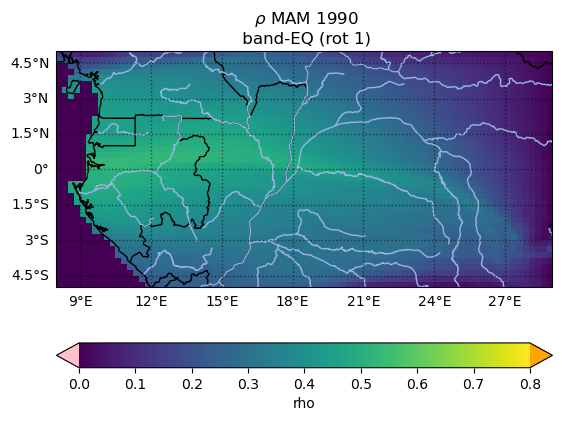

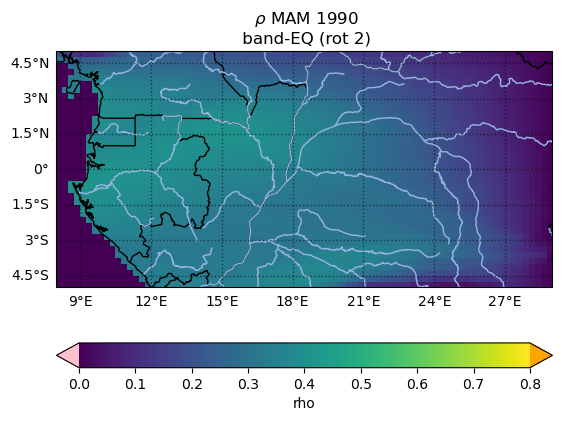

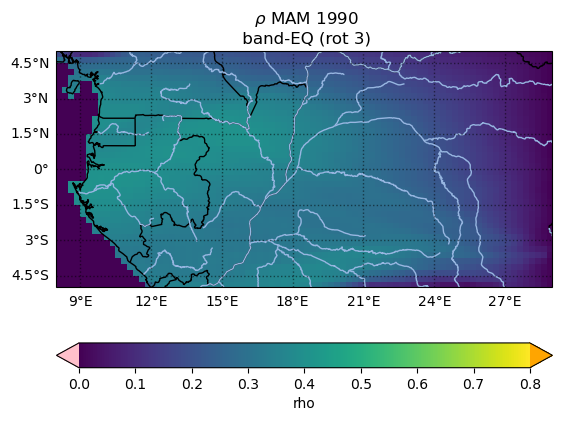

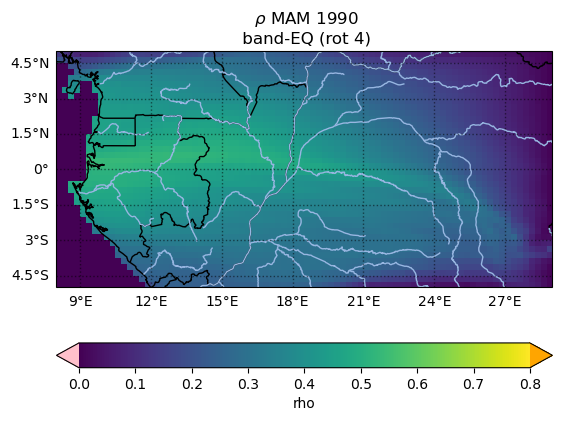

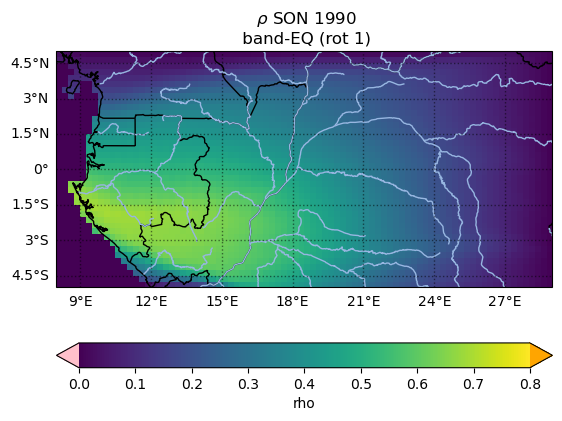

...

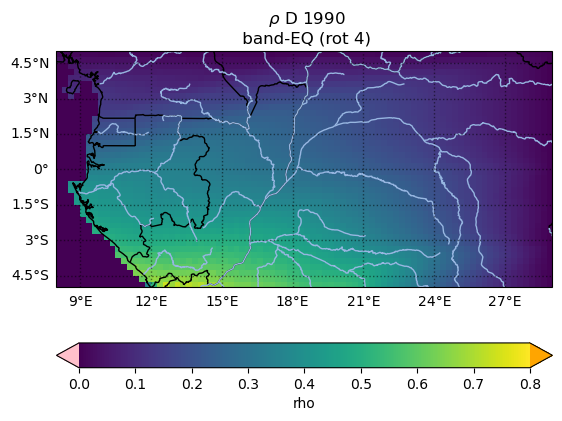

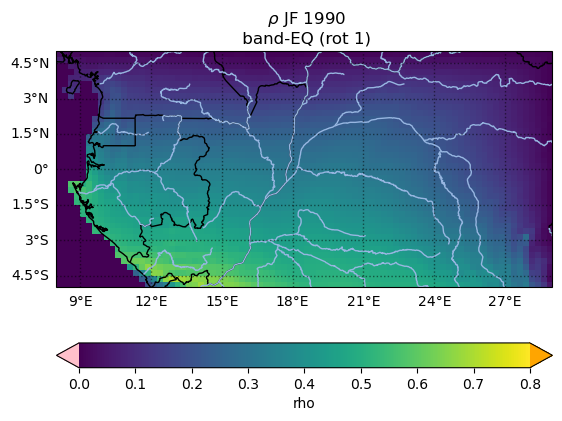

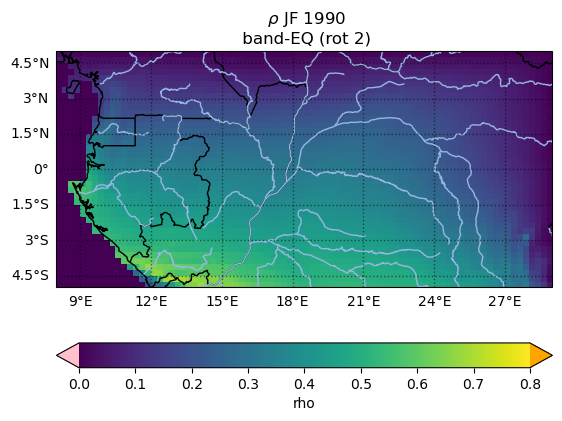

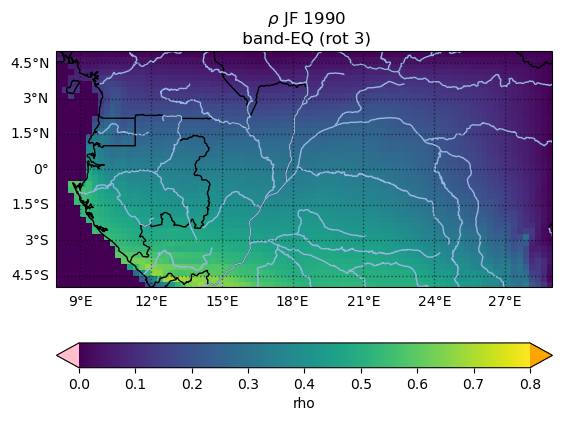

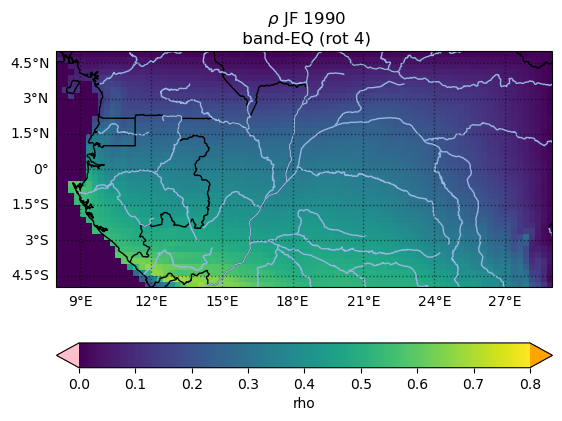

In [12]:
# Create seasonal arrays and plot these

seas={'MAM':[3,4,5],'SON':[9,10,11],'JJA':[6,7,8],'D':[12],'JF':[1,2]}
for S in seas:
    for r in np.arange(1,5):
        rho_plot = rho_xarr['rho'][r-1,:,:,:] 
        seas_rho = rho_plot.sel(time=rho_xarr.time.dt.month.isin(seas[S]))
        fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
        ax.coastlines()
        ax.add_feature(cartopy.feature.BORDERS)
        ax.add_feature(cartopy.feature.RIVERS)
        #ax.add_feature(cartopy.feature.OCEAN,zorder=2,facecolor='lightgrey')
        cmap=plt.cm.viridis
        cmap.set_extremes(over='orange')
        cmap.set_extremes(under='pink')
        collection = seas_rho.mean("time").plot.pcolormesh(vmin=0.0,vmax=0.8,
                                                        #levels=13,
                                                        ax=ax,extend='both',cmap=cmap,
                                                        cbar_kwargs={"location":"bottom"} )
        ax.set_extent([band[B][2],band[B][3],band[B][0],band[B][1]])
        ax.set_title(" $\\rho$"+" "+S+" "+str(YR)+"\n band-"+B+" (rot "+str(r)+")")
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
              linewidth=1, color='black', alpha=0.5, linestyle='dotted',zorder=100)
        gl.top_labels = False
        gl.right_labels = False
        plt.savefig(datap+'nudged_max_'+str(max_iter)+'_tol_'+str(tol)+'_'+L_NAME+"_"+S_NAME+"_rho_"+S+"_"+str(YR)+"_"+B+"rot"+str(r)+".png")
        plt.show()
        

rho_xarr.close()
    
    